image.png


<h1><center><font size=10><a name='link6'>Data Science and Business Analytics</a></center></font></h1>


<h1><center> Practice Project I </center></h1>

<h1><center>Visualizations for Effective Story Telling</center></h1>



<h1><center> By </center></h1>



<h1><center>Hayford Osumanu </center></h1>



<h1><center>February  2023 </center></h1>


image.png

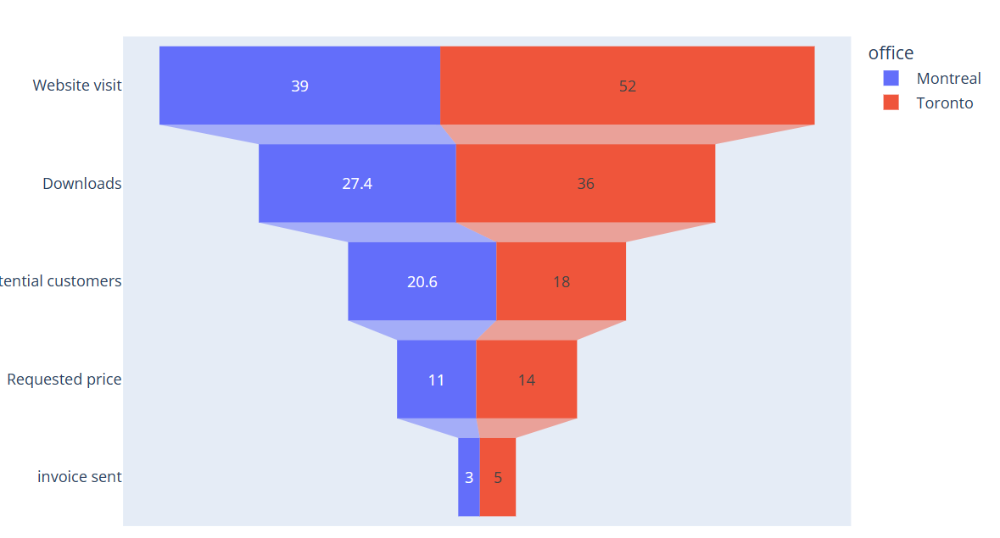

# <h1><left><font size=10><a name='link6'>Content</a></center></font></h1>

### 1.0 Intalling Python Libraries

### 2.0 Importing Python Libraries

### 3.0 Setting Up Codes for Visualization

### 4.0 Python Libraries Overview

### 5.0 Distribution Plots

- ### 5.1 Pyramid Plots

- ### 5.2 Funnel Plots

- #### 5.3 Histogram

- #### 5.4 Box Plots

- #### 5.5 Density Plots

- #### 5.6 Displots

- #### 5.7 Voilin Plots

- #### 5.8 Area Plots

### 6.0 Correlation Plots

- #### 6.1 Correlation Matrix

- #### 6.2 Heatmaps 

- #### 6.3 Pairplots

- #### 6.4 Combined Plots

### 7.0 Circular and Rectangular Plots

- #### 7.1 Sunburst Charts

- #### 7.2 Pie Charts

- #### 7.3 Radar Charts

### 8.0 Time Series and Lines Plots

### 9.0 Folium/Map Plots

image.png

# <h1><left><font size=10><a name='link6'>1.0: Installing Libraries</a></center></font></h1>

In [ ]:
# installing the needed upgrade optimum performance
!pip install squarify
!pip3 install folium==0.5.0
# installing the needed upgrade optimum performance
!pip install nb_black
!pip install ipython --upgrade
!pip install xgboost
!pip install plotly==5.13.0
!pip install dash

In [ ]:
!pip install dash
!pip install jupyter-dash
!pip install pandas

image.png

# <h1><left><font size=10><a name='link6'>2.0: Importing Relevant Libraries</a></center></font></h1>

In [ ]:
# matploblib and seaborn for visualizations
import numpy as np   
import pandas as pd
import folium

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
#import Dash

# matploblib and seaborn for visualizations
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_context('talk')

import pandas as pd
import numpy as np

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# this will help in making the Python code more structured automatically (good coding practice)
#%load_ext nb_black
import warnings

warnings.filterwarnings("ignore")


In [ ]:
# Other important packages for data data analysis
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from statsmodels.formula.api import ols
from statsmodels.graphics.gofplots import ProbPlot
import statsmodels.api as sm
from scipy import stats;

image.png

# <h1><left><font size=10><a name='link6'>3.0: Setting Up Codes for Visualizations</a></center></font></h1>

In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [ ]:
### function to plot distributions wrt target


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(25, 9))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

In [ ]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 3, 3))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

image.png

# <h1><left><font size=10><a name='link6'>4.0:Python Libraries Overview</a></center></font></h1>

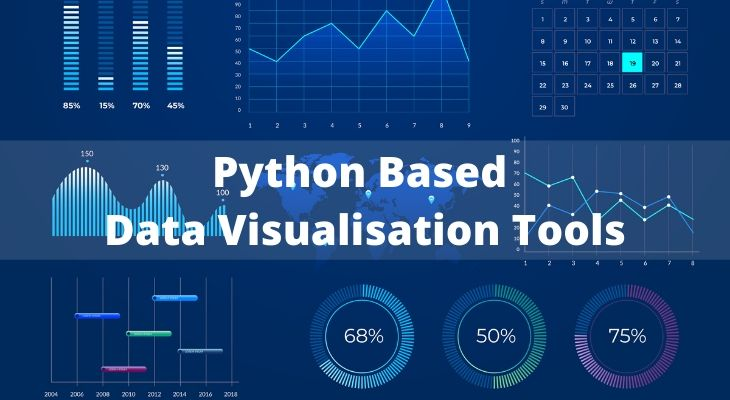

### Python Libraries

A `Python library` is a collection of functions and methods that allow you to perform lots of actions without writing any code. The libraries usually contain built in modules providing different functionalities which you can use directly. 


## `Scientific Computing Libraries`
- `Pandas:` Pandas library is a very high-level Python library that provides high performance easy to use data structures. It has many functions for data importing, manipulation and analysis. In particular, it offers data structures and operations for manipulating numerical tables and timeseries. 


- `Numpy:` NumPy works with N-dimensional arrays in Python. It enables you to do computation efficiently and effectively. It is better than regular Python because of its amazing capabilities.  For example, for working with arrays, dictionaries, functions, datatypes and working with images you need to know NumPy. 


- `Scpy:` SciPy is a collection of numerical algorithms and domain specific toolboxes, including signal processing, optimization, statistics and much more. 
SciPy is a good library for scientific and high performance computation

## `Visualizations Libraries`

- `Matplotlib:`Matplotlib is a very popular plotting package that provides 2D plotting, as well as 3D plotting. Basic knowledge about these three packages which are built on top of Python, is a good asset for data scientists who want to work with real-world problems. 


- `Seaborn:` Another high level visualization library is Seaborn. 
It is based on Matplotlib. It's very easy to generate various plots such as heat maps, time series and violin plots.

- `Folium:` Folium is a powerful data visualization library in Python that was built primarily to help people visualize geospatial data. With Folium, you can create a map of any location in the world as long as you know its latitude and longitude values. You can also create a map and superimpose markers as well as clusters of markers on top of the map for cool and very interesting visualizations. You can also create maps of different styles such as street level map, stamen map etc.
 

## `Algorithmic Libraries`

- `Scikit Learn:` Scikit-learn library contains tools statistical modeling, 
including regression, classification, clustering, and so on.This library is built on NumPy, SciPy and Matplotib. 


- `Statsmodel:` Statsmodels is also a Python module that allows users to explore data, estimate statistical models and perform statistical tests.



image.png

# <h1><left><font size=10><a name='link6'>6.0:Correlation Plots</a></center></font></h1>

## Correlations

### `Correlation` is a statistical measure that describes the relationship between two variables. It is a measure of how closely related two variables are, and how they tend to move together.

### The correlation coefficient, often denoted by the symbol "r," is a number that ranges between -1 and +1, where -1 indicates a perfect negative correlation (i.e., as one variable increases, the other variable decreases), +1 indicates a perfect positive correlation (i.e., as one variable increases, the other variable also increases), and 0 indicates no correlation (i.e., the two variables are unrelated).

### The correlation coefficient is calculated by dividing the covariance of the two variables by the product of their standard deviations. A positive correlation coefficient means that the two variables tend to move in the same direction, while a negative correlation coefficient means that the two variables tend to move in opposite directions.

### Correlation is an important concept in statistics and data analysis, as it can help researchers to understand the relationship between different variables, and to make predictions or test hypotheses about how changes in one variable may affect another. However, it is important to note that correlation does not imply causation, and that other factors may be responsible for the relationship between two variables.

### `When to use Correlation in Data Visualizations`

- ### Correlation is commonly used in data analysis and research to determine the relationship between two variables. Here are some situations where correlation is used:

- ### `Understanding relationships`: Correlation can be used to understand the nature and strength of the relationship between two variables. By calculating the correlation coefficient, you can determine whether the variables are positively or negatively related, and how strong the relationship is.

- ### `Predictive modeling`: Correlation can be used to create predictive models, where one variable is used to predict the other. For example, if you have data on sales and advertising spend, you can use correlation to determine how changes in advertising spend are likely to affect sales.

- ### `Hypothesis testing`: Correlation can be used to test hypotheses about the relationship between two variables. For example, if you hypothesize that there is a positive relationship between temperature and ice cream sales, you can use correlation to test this hypothesis.

- ### `Data cleaning`: Correlation can be used to identify errors and outliers in a dataset. If you have a large dataset, you can use correlation to identify values that are significantly different from the rest of the data.

### Overall, correlation is a useful tool for understanding the relationship between two variables, and can be used in a variety of situations, from predictive modeling to hypothesis testing. However, it is important to remember that correlation does not imply causation, and that other factors may be responsible for the relationship between two variables.

### Advantages of using correlation include:

- #### `Quantifying relationships`: Correlation provides a quantitative measure of the relationship between two variables. This can help you better understand the strength and direction of the relationship.

- #### `Predictive power`: Correlation can be used to create predictive models, where one variable is used to predict the other. This can be useful for making forecasts or identifying trends.

- #### `Hypothesis testing`: Correlation can be used to test hypotheses about the relationship between two variables. This can help you determine whether there is a statistically significant relationship between the variables.

- #### `Data cleaning`: Correlation can be used to identify outliers and errors in a dataset. This can be helpful for cleaning and preparing data for further analysis.

### Disadvantages of using correlation include:

- #### `Causation`: Correlation does not imply causation. Just because two variables are correlated does not mean that one causes the other.

- #### `Spurious correlations`: Correlation can sometimes identify spurious relationships between variables that are not actually related. This can be a problem when interpreting the results.

- #### `Sample size`: Correlation can be affected by the size of the sample. Small samples may produce unreliable correlation coefficients.

- #### `Nonlinear relationships`: Correlation is most useful for identifying linear relationships between two variables. If the relationship is nonlinear, correlation may not be the best tool to use.

#### Overall, correlation is a useful tool for quantifying the relationship between two variables, but it has limitations and may not be suitable for all datasets. It is important to consider the advantages and disadvantages of correlation when deciding whether to use it for your data analysis. Additionally, it's important to keep in mind that correlation is only one tool in the data analyst's toolkit, and should be used in conjunction with other statistical and analytical methods.

image.png

### Correlation Plots Frequently Used

## Correlation Matrix



### A `correlation matrix` is a table that displays the correlation coefficients between pairs of variables in a dataset. Each row and column in the matrix represents a different variable, and the cells contain the correlation coefficient between the two variables represented by that row and column. The diagonal of the matrix contains the correlation coefficient of each variable with itself, which is always equal to 1.

### The correlation coefficient is a statistical measure that indicates the strength and direction of the relationship between two variables. The coefficient can range from -1 to 1, where -1 indicates a perfect negative correlation, 0 indicates no correlation, and 1 indicates a perfect positive correlation.

### Correlation matrices are often used to identify which variables are strongly correlated with each other. This can be useful for a variety of data analysis tasks, including feature selection, data visualization, and modeling. Correlation matrices can also help identify potential issues with multicollinearity, where two or more variables in a regression model are highly correlated with each other, which can lead to unstable estimates of the regression coefficients.

### Overall, correlation matrices are a useful tool for exploring the relationships between variables in a dataset, and can provide valuable insights into the structure of the data.

###  Applications of Correlation Matrix

In [ ]:
# importing the dataset
import pandas as pd
url="https://raw.githubusercontent.com/hayfordosmandata/DataBank/main/Diabetes_1.csv"
df=pd.read_csv(url, encoding="unicode_escape")

# First 4 rows of the dataset
df.head(4)

,Pregnancies,Glucose,Blood Pressure,Skin Thickness,Insulin,BMI,Diabetes Pedigree Function,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0


image.png

##### Using Correlation Matrix` is a table that displays the correlation coefficients between pairs of numerical variables in a dataset.

In [ ]:
# Displaying correlation between numerical variables
df.corr()

,Pregnancies,Glucose,Blood Pressure,Skin Thickness,Insulin,BMI,Diabetes Pedigree Function,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
Blood Pressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
Skin Thickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
Diabetes Pedigree Function,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


## Heatmap

### A `Heatmap` is a graphical representation of data where the values are displayed as colors on a two-dimensional matrix. 

- ### Heatmaps are commonly used to visualize correlation between variables, and the colors represent the strength and direction of the correlation. 

- ### Heatmaps can also be used to identify patterns in the data and to highlight differences or similarities between different groups or categories. 

- ### Heatmaps are particularly useful when working with large datasets, as they can help identify patterns that may be difficult to see in raw data.

### Overall, the main difference between a pairplot and a heatmap is that a pairplot shows pairwise relationships between variables in a dataset, while a heatmap visualizes correlation between variables using colors on a two-dimensional matrix. Both visualizations can be useful for different types of data analysis tasks and can provide valuable insights into the data.





image.png

### Applications of Heatmaps

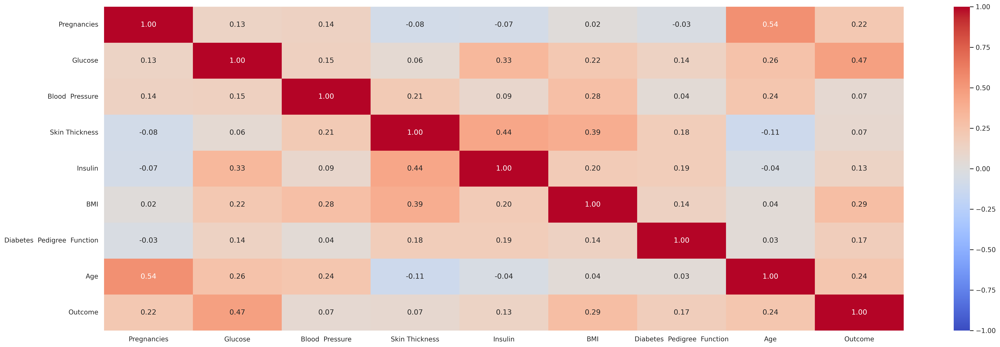

In [ ]:
# Displaying the correlation between numerical variables of the dataset
plt.figure(figsize=(30, 10))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="coolwarm")
plt.show()

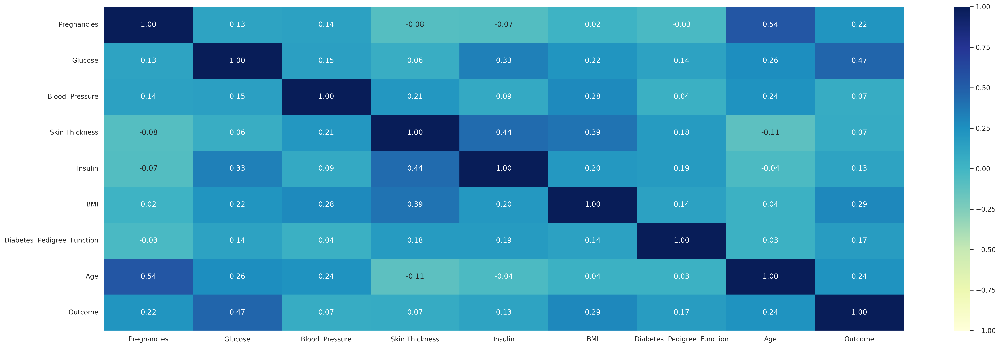

In [ ]:
# creates heatmap showing correlation of numeric columns in data
plt.figure(figsize=(30, 10))
sns.heatmap(df.corr(), vmin=-1, vmax=1, cmap="YlGnBu", annot=True, fmt=".2f");

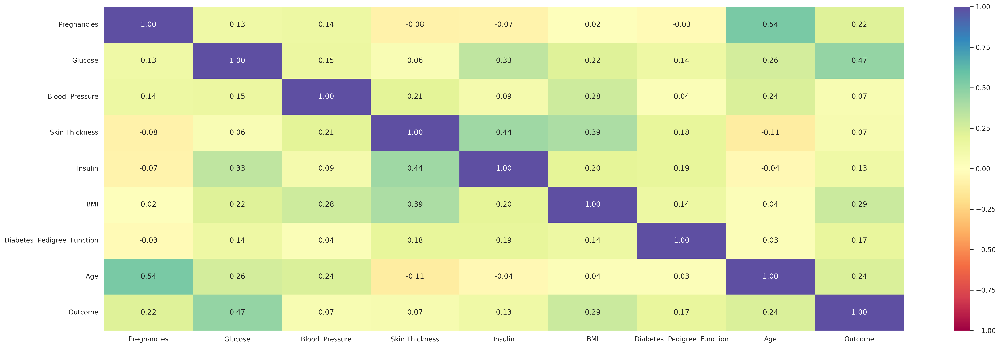

In [ ]:
cols_list = df.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(30, 10))
sns.heatmap(
    df[cols_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
) ## Complete the code to find the correlation between the variables
plt.show()

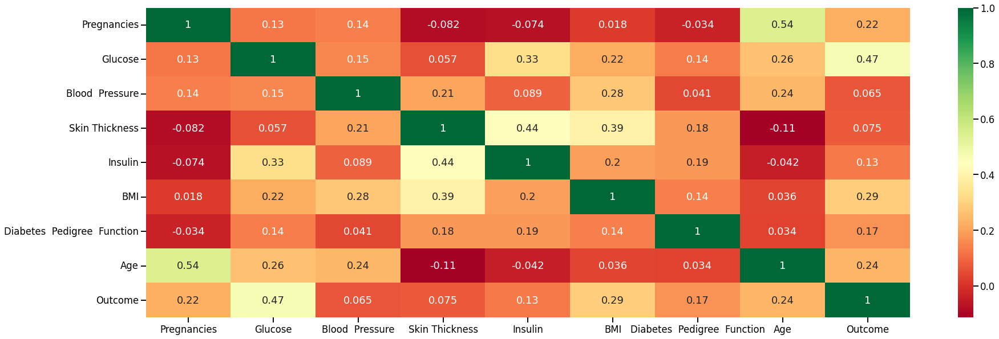

In [ ]:
# using heatmap
correlation = df.corr() # creating a 2-D Matrix with correlation plots
plt.figure(figsize=(30,10))
sns.heatmap(correlation, annot=True, cmap="RdYlGn");

In [ ]:
import plotly.express as px
data=[[1, 25, 30, 50, 1], [20, 1, 60, 80, 30], [30, 60, 1, 5, 20]]
fig = px.imshow(data,
                labels=dict(x="Day of Week", y="Time of Day", color="Productivity"),
                x=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'],
                y=['Morning', 'Afternoon', 'Evening']
               )
fig.update_xaxes(side="top")
fig.show()

image.png

## Pair Plots

### Pairplot:

### A `pairplot` is a visualization that plots pairwise relationships between variables in a dataset. It creates scatterplots between all pairs of variables, and histograms for each variable along the diagonal of the plot. Pairplots are useful for visualizing the relationship between multiple variables at once and for identifying patterns or trends in the data. Pairplots can also highlight any correlation or association between variables, as well as any outliers or anomalies.

### Applications of PairPlots

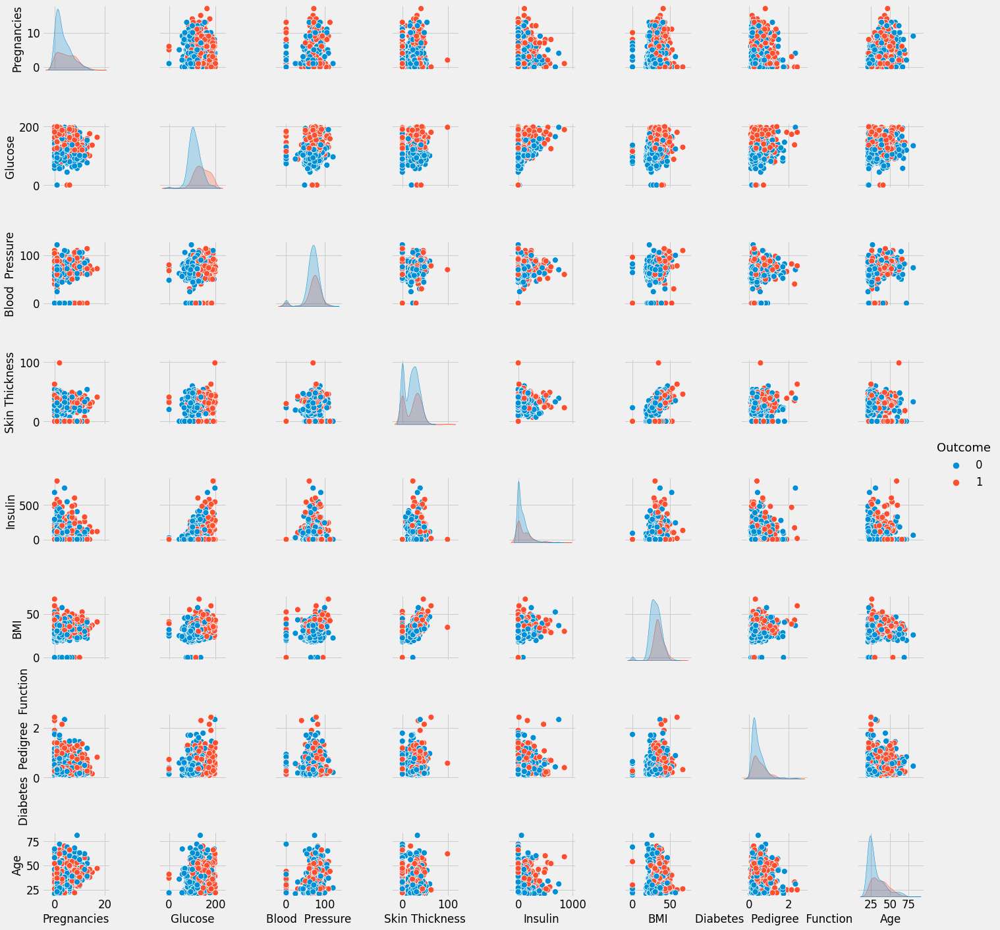

In [ ]:
plt.style.use('fivethirtyeight')
sns.pairplot(df, hue = 'Outcome', vars = df.columns[:8], diag_kind = 'kde');

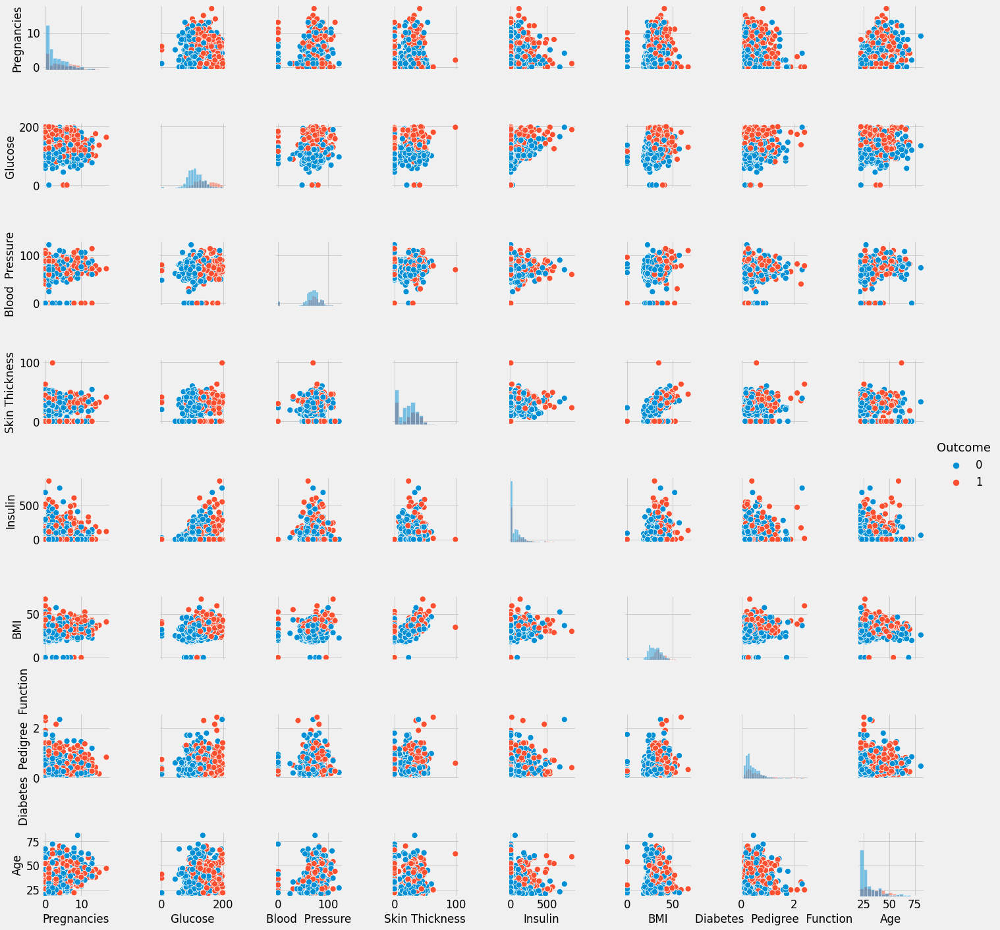

In [ ]:
import seaborn as sns

sns.pairplot(df , hue='Outcome' , diag_kind = 'hist',diag_kws=dict(fill=True))
plt.show()

image.png

In [ ]:
# correlation betweon one column and the rest
df.corr()['Outcome']

Pregnancies                     0.221898
Glucose                         0.466581
Blood  Pressure                 0.065068
Skin Thickness                  0.074752
Insulin                         0.130548
BMI                             0.292695
Diabetes  Pedigree  Function    0.173844
Age                             0.238356
Outcome                         1.000000
Name: Outcome, dtype: float64

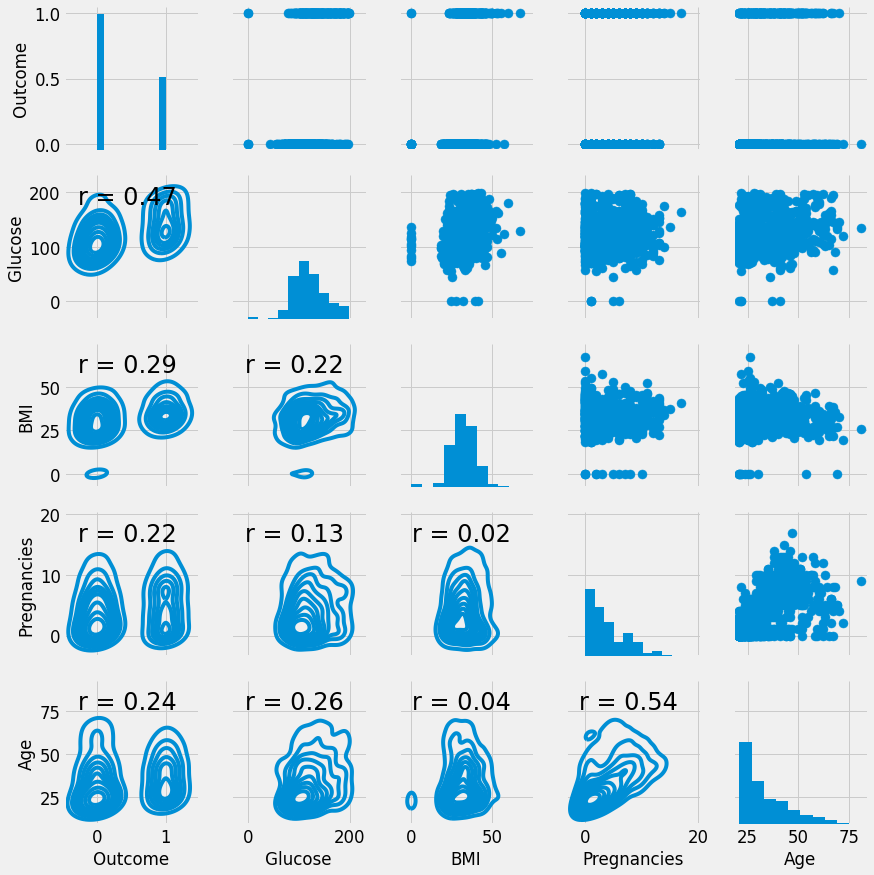

In [ ]:
import scipy

# Function to calculate correlation coefficient between two variables
def corrfunc(x, y, **kwgs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.1, .8), xycoords=ax.transAxes,
               size = 24)

# Create a PairGrid
g = sns.PairGrid(data = df,  
                 vars = ['Outcome', 'Glucose', 'BMI', 'Pregnancies', 'Age'])

# Map a scatterplot to the upper triangle
g.map_upper(plt.scatter)

# Map a histogram to the diagonal
g.map_diag(plt.hist)

# Map a kde plot to the lower triangle
g.map_lower(sns.kdeplot)

# Map the correlation coefficient to the lower diagonal
g.map_lower(corrfunc)

In [ ]:
data = sns.load_dataset("penguins")
data.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


In [ ]:
sns.set_theme()
# For the image quality of the graphic. 
sns.set(rc={"figure.dpi":300})
# For the size of the graphics
sns.set(rc = {"figure.figsize":(5,3)})

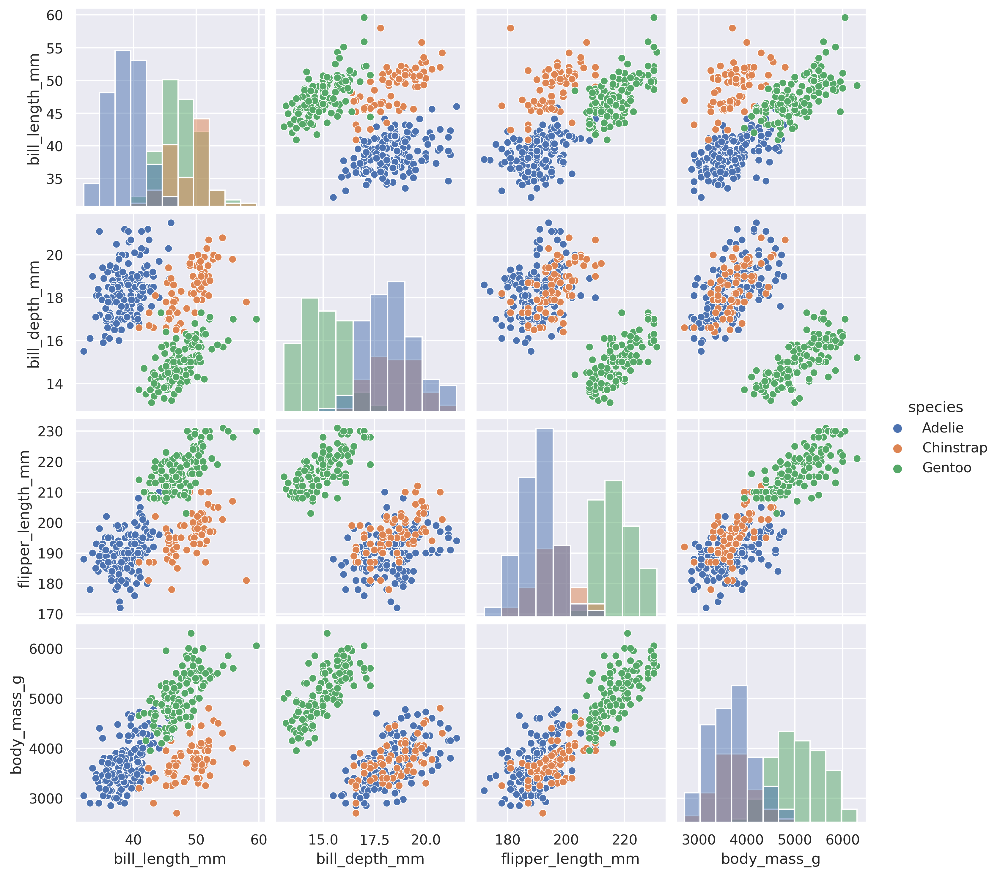

In [ ]:
sns.pairplot(data, hue="species", diag_kind="hist");

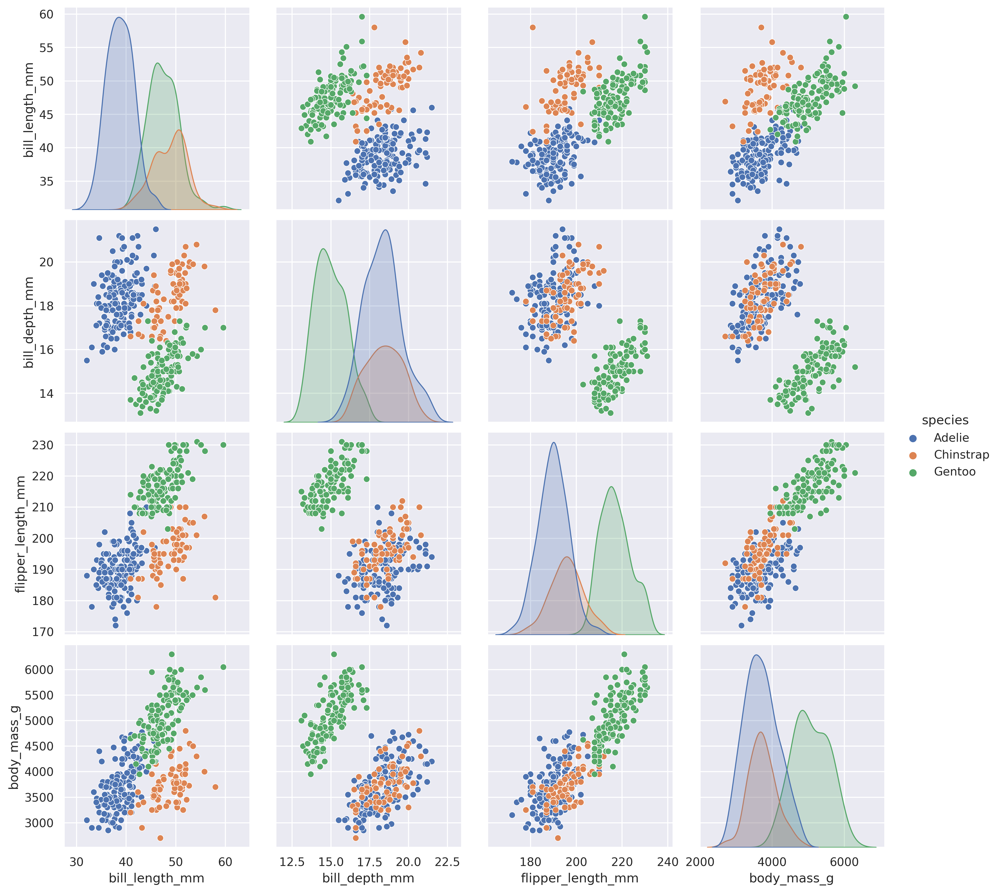

In [ ]:
sns.pairplot(data, hue="species", height=3);

<Figure size 1200x640 with 0 Axes>

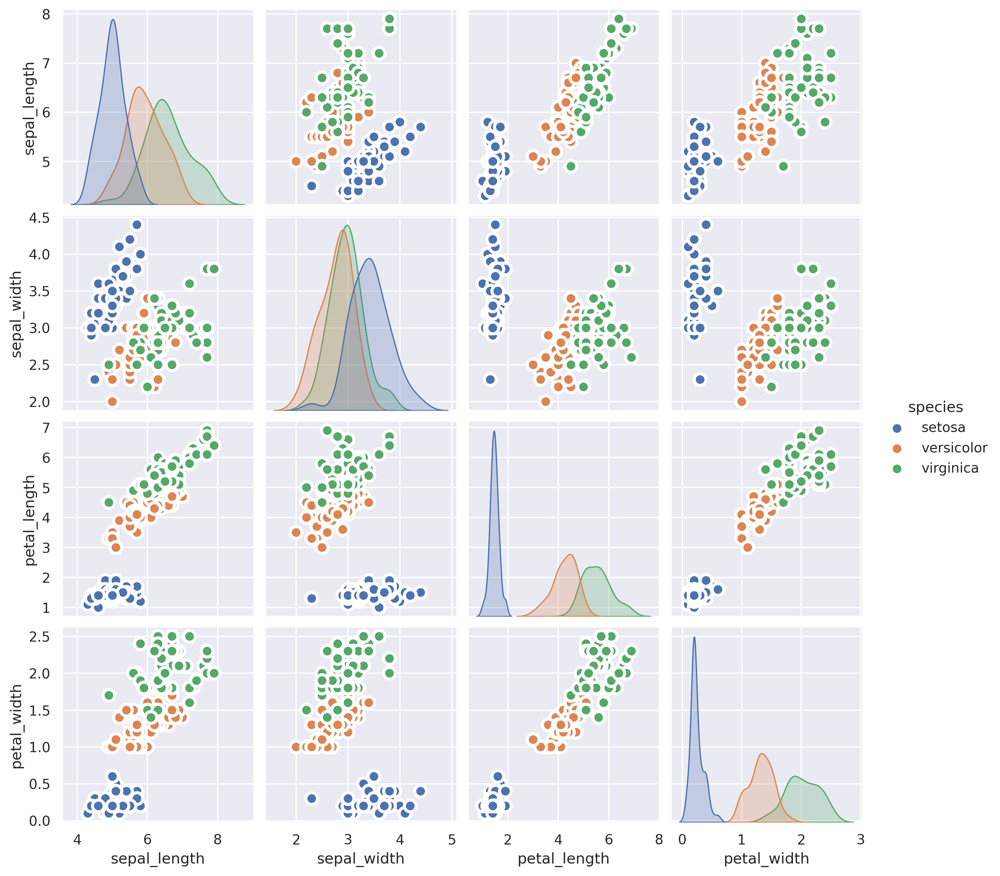

In [ ]:
# Load Dataset
df = sns.load_dataset('iris')

# Plot
plt.figure(figsize=(15,8), dpi= 80)
sns.pairplot(df, kind="scatter", hue="species", plot_kws=dict(s=90, edgecolor="white", linewidth=2.5))
plt.show();

image.png

## Scatter Plots

### A `scatter` plot is a type of graphical representation used to display the relationship between two continuous variables. It is a way of visualizing the correlation between two variables to determine whether there is a relationship or pattern between them. The scatter plot consists of a series of points on a two-dimensional plane, where each point represents the values of two variables, one plotted along the x-axis and the other plotted along the y-axis. The position of each point represents the value of the two variables for a particular observation.

### Scatter plots are commonly used in various fields such as statistics, data analysis, machine learning, and scientific research. They are often used to identify trends, patterns, clusters, or outliers in a dataset, and to understand the relationship between two variables. By examining the shape of the scatter plot, one can make conclusions about the strength and direction of the relationship between the two variables.

### When do we use Scatter Plots

- ### Scatter plots are commonly used in data analysis and statistical research to visualize the relationship between two continuous variables. Here are some situations where scatter plots are commonly used:

- #### `Identifying Patterns`: Scatter plots are useful for identifying patterns and trends in the data. By examining the scatter plot, you can determine whether there is a positive, negative, or no correlation between the variables.


- #### `Outlier Detection`: Scatter plots are also useful for identifying outliers in the data. Outliers are data points that fall outside the general pattern of the data, and they can have a significant impact on the results of statistical analysis. A scatter plot can help to identify these outliers.


- #### `Visualization`: Scatter plots are useful for visualizing large data sets. They allow you to see the distribution of the data and can help to identify clusters or subgroups within the data.


- #### `Hypothesis Testing`: Scatter plots are often used to test hypotheses about the relationship between two variables. By comparing the pattern of the data to a theoretical model, you can determine whether there is a statistically significant relationship between the variables.


### Overall, scatter plots are a useful tool for visualizing and analyzing the relationship between two continuous variables.

### Advantages of using scatter plots include:

- ### `Visualization`: Scatter plots are an effective way to visualize data and can help you quickly identify trends, patterns, and outliers.


- ### `Relationships`: Scatter plots can help you identify and quantify the relationship between two variables. You can use this information to make predictions or test hypotheses.


- ### `Clustering`: Scatter plots can be used to identify clusters or subgroups within the data. This information can be helpful in making decisions or identifying patterns.


- ### `Large datasets`: Scatter plots can be used to visualize large datasets, making it easier to understand the overall distribution of the data.


### Disadvantages of using scatter plots include:

### `Limited to two variables`: Scatter plots can only be used to visualize the relationship between two variables. If you have more than two variables, you will need to create additional scatter plots or use other visualization techniques.


### `Overplotting`: If you have a large number of data points, they can overlap and make it difficult to see the overall pattern in the data.

`Nonlinear relationships`: Scatter plots are most useful for identifying linear relationships between two variables. If the relationship is nonlinear, a scatter plot may not be the best tool to use.


### `Missing data`: If there are missing values in your dataset, it may not be possible to create a scatter plot for all observations.


### Overall, scatter plots are a useful tool for visualizing the relationship between two variables, but they have limitations and may not be suitable for all datasets. It is important to consider the advantages and disadvantages of scatter plots when deciding whether to use them for your data analysis.

image.png

### Practical Applications of Scatter Plots

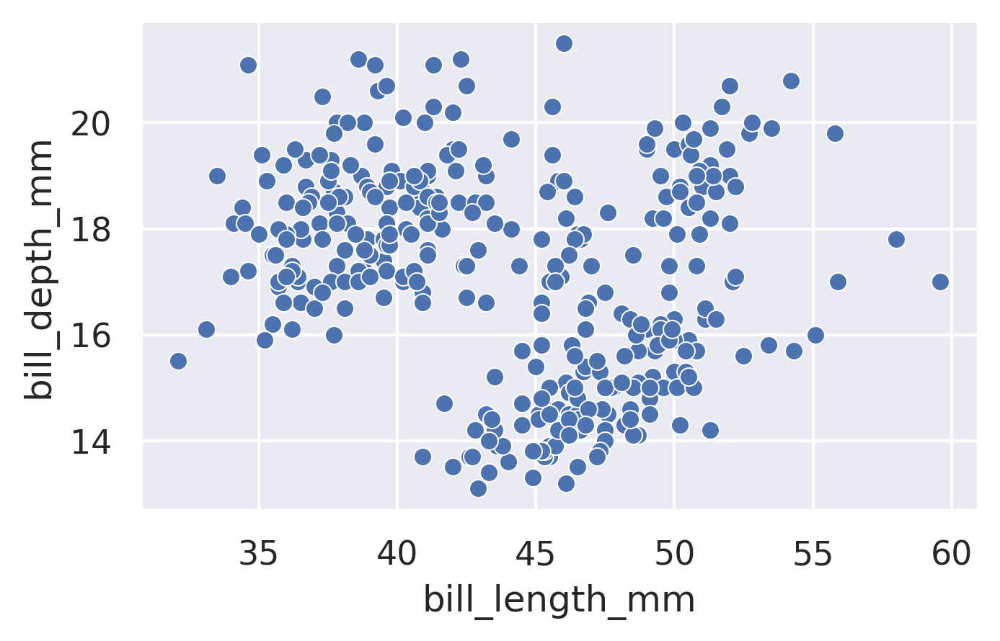

In [ ]:
# Scatter Plot of Bill lenght vs Bill Depth
sns.scatterplot( x = "bill_length_mm", 
                 y = "bill_depth_mm", 
                 data = data);

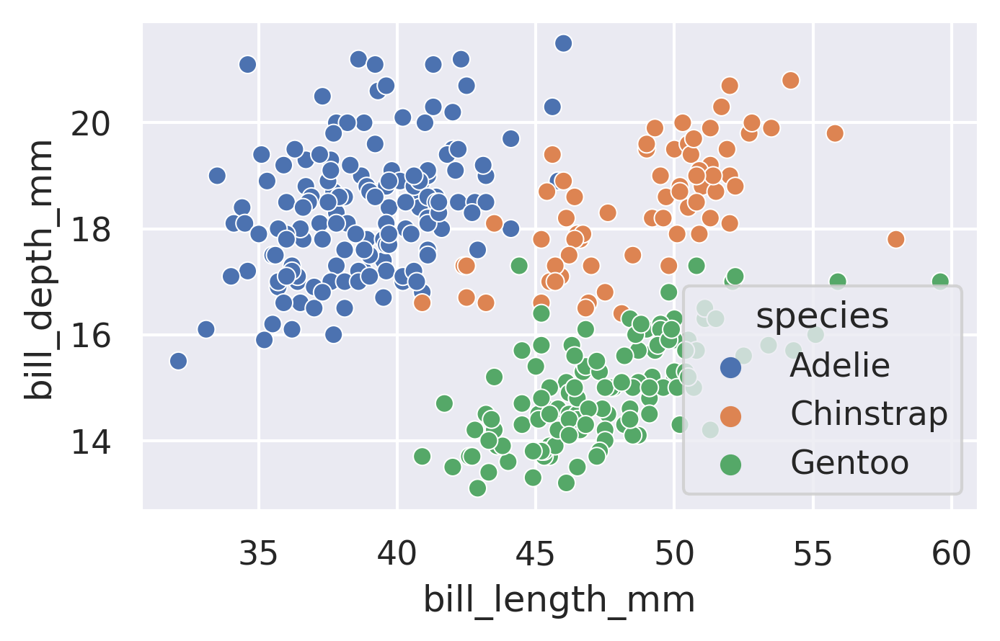

In [ ]:
# Scatter plot of Bill lenght vs Bill Depth respect to Species
sns.scatterplot( x = "bill_length_mm", 
                 y = "bill_depth_mm", 
                 data = data, 
                 hue = "species");

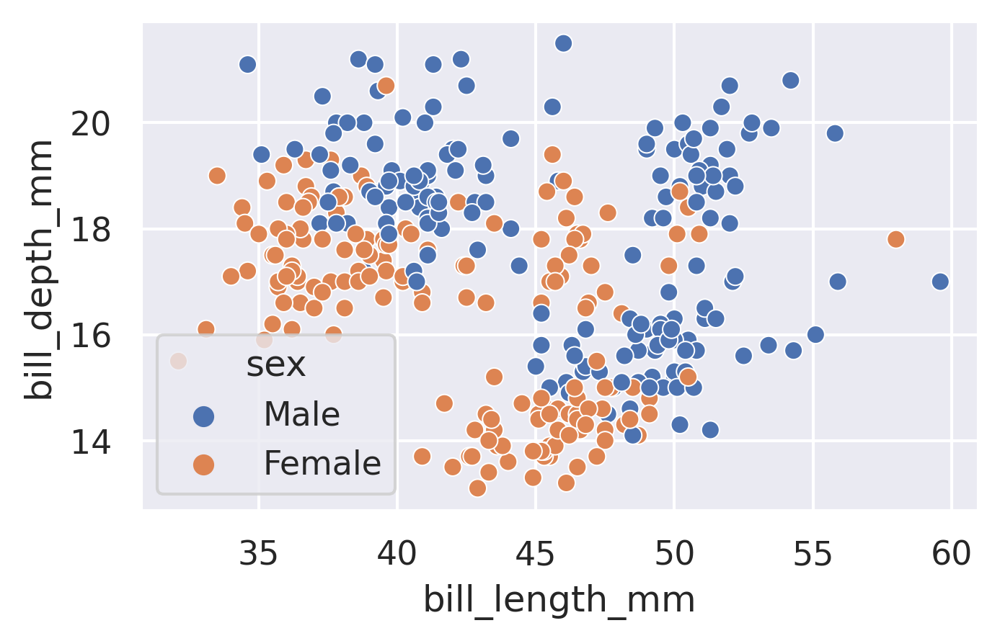

In [ ]:
# Scatter plot of Bill lenght vs Bill Depth respect to Sex
sns.scatterplot( x = "bill_length_mm", 
                 y = "bill_depth_mm", 
                 data = data, 
                 hue = "sex");

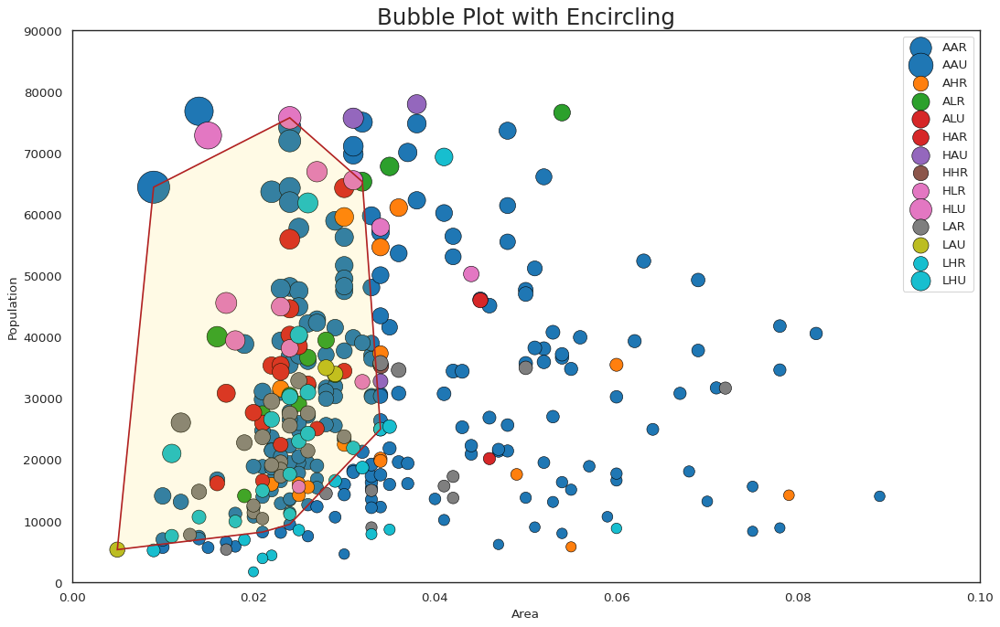

In [ ]:
from matplotlib import patches
from scipy.spatial import ConvexHull
import warnings; warnings.simplefilter('ignore')
sns.set_style("white")

# Step 1: Prepare Data
midwest = pd.read_csv("https://raw.githubusercontent.com/selva86/datasets/master/midwest_filter.csv")

# As many colors as there are unique midwest['category']
categories = np.unique(midwest['category'])
colors = [plt.cm.tab10(i/float(len(categories)-1)) for i in range(len(categories))]

# Step 2: Draw Scatterplot with unique color for each category
fig = plt.figure(figsize=(16, 10), dpi= 80, facecolor='w', edgecolor='k')    

for i, category in enumerate(categories):
    plt.scatter('area', 'poptotal', data=midwest.loc[midwest.category==category, :], s='dot_size', c=colors[i], label=str(category), edgecolors='black', linewidths=.5)

# Step 3: Encircling
# https://stackoverflow.com/questions/44575681/how-do-i-encircle-different-data-sets-in-scatter-plot
def encircle(x,y, ax=None, **kw):
    if not ax: ax=plt.gca()
    p = np.c_[x,y]
    hull = ConvexHull(p)
    poly = plt.Polygon(p[hull.vertices,:], **kw)
    ax.add_patch(poly)

# Select data to be encircled
midwest_encircle_data = midwest.loc[midwest.state=='IN', :]                         

# Draw polygon surrounding vertices    
encircle(midwest_encircle_data.area, midwest_encircle_data.poptotal, ec="k", fc="gold", alpha=0.1)
encircle(midwest_encircle_data.area, midwest_encircle_data.poptotal, ec="firebrick", fc="none", linewidth=1.5)

# Step 4: Decorations
plt.gca().set(xlim=(0.0, 0.1), ylim=(0, 90000),
              xlabel='Area', ylabel='Population')

plt.xticks(fontsize=12); plt.yticks(fontsize=12)
plt.title("Bubble Plot with Encircling", fontsize=22)
plt.legend(fontsize=12)    
plt.show();    

#####`Distribution of Iris Dataset`

In [ ]:
# Using Iris Dataset in Searbon
df = px.data.iris().head()
df

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


In [ ]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

In [ ]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species")
fig.show()

In [ ]:
import plotly.express as px
df = px.data.iris()
df["e"] = df["sepal_width"]/100
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species", error_x="e", error_y="e")
fig.show()

In [ ]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter_matrix(df, dimensions=["sepal_width", "sepal_length", "petal_width", "petal_length"], color="species")
fig.show()

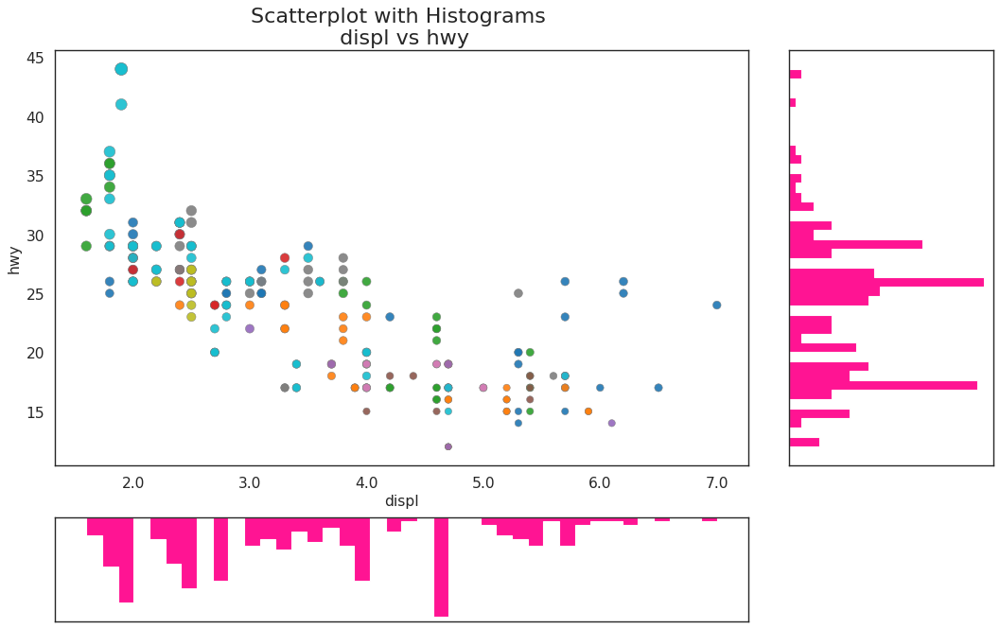

In [ ]:
# Import Data
df = pd.read_csv("https://raw.githubusercontent.com/selva86/datasets/master/mpg_ggplot2.csv")

# Create Fig and gridspec
fig = plt.figure(figsize=(16, 10), dpi= 80)
grid = plt.GridSpec(4, 4, hspace=0.5, wspace=0.2)

# Define the axes
ax_main = fig.add_subplot(grid[:-1, :-1])
ax_right = fig.add_subplot(grid[:-1, -1], xticklabels=[], yticklabels=[])
ax_bottom = fig.add_subplot(grid[-1, 0:-1], xticklabels=[], yticklabels=[])

# Scatterplot on main ax
ax_main.scatter('displ', 'hwy', s=df.cty*4, c=df.manufacturer.astype('category').cat.codes, alpha=.9, data=df, cmap="tab10", edgecolors='gray', linewidths=.5)

# histogram on the right
ax_bottom.hist(df.displ, 40, histtype='stepfilled', orientation='vertical', color='deeppink')
ax_bottom.invert_yaxis()

# histogram in the bottom
ax_right.hist(df.hwy, 40, histtype='stepfilled', orientation='horizontal', color='deeppink')

# Decorations
ax_main.set(title='Scatterplot with Histograms \n displ vs hwy', xlabel='displ', ylabel='hwy')
ax_main.title.set_fontsize(20)
for item in ([ax_main.xaxis.label, ax_main.yaxis.label] + ax_main.get_xticklabels() + ax_main.get_yticklabels()):
    item.set_fontsize(14)

xlabels = ax_main.get_xticks().tolist()
ax_main.set_xticklabels(xlabels)
plt.show()


In [ ]:
df = px.data.election().head()
df

,district,Coderre,Bergeron,Joly,total,winner,result,district_id
0,101-Bois-de-Liesse,2481,1829,3024,7334,Joly,plurality,101
1,102-Cap-Saint-Jacques,2525,1163,2675,6363,Joly,plurality,102
2,11-Sault-au-Récollet,3348,2770,2532,8650,Coderre,plurality,11
3,111-Mile-End,1734,4782,2514,9030,Bergeron,majority,111
4,112-DeLorimier,1770,5933,3044,10747,Bergeron,majority,112


In [ ]:
import plotly.express as px
df = px.data.election()
fig = px.scatter_3d(df, x="Joly", y="Coderre", z="Bergeron", color="winner", size="total", hover_name="district",
                  symbol="result", color_discrete_map = {"Joly": "blue", "Bergeron": "green", "Coderre":"red"})
fig.show()

In [ ]:
import plotly.express as px
df = px.data.election()
fig = px.scatter_ternary(df, a="Joly", b="Coderre", c="Bergeron", color="winner", size="total", hover_name="district",
                   size_max=15, color_discrete_map = {"Joly": "blue", "Bergeron": "green", "Coderre":"red"} )
fig.show()

In [ ]:
import plotly.express as px
df = px.data.gapminder()
fig = px.scatter(df.query("year==2007"), x="gdpPercap", y="lifeExp", size="pop", color="continent",
           hover_name="country", log_x=True, size_max=60)
fig.show()

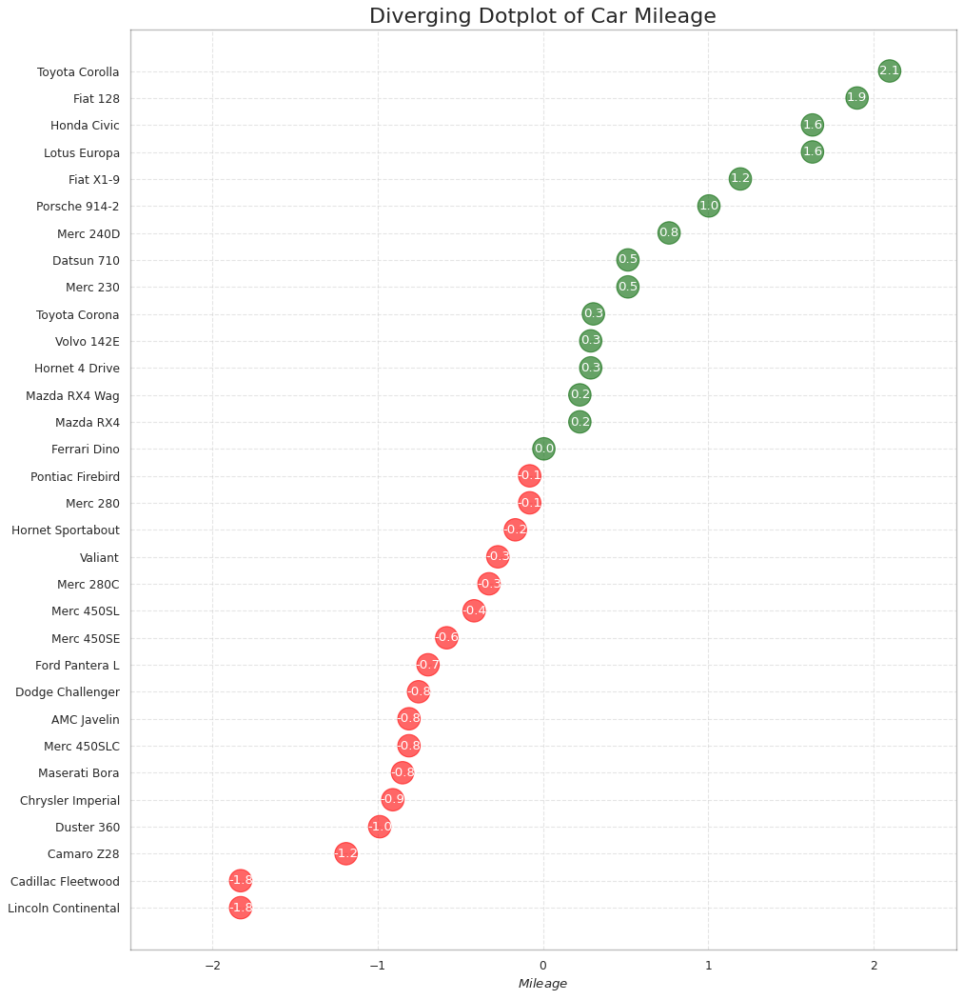

In [ ]:
# Prepare Data
df = pd.read_csv("https://github.com/selva86/datasets/raw/master/mtcars.csv")
x = df.loc[:, ['mpg']]
df['mpg_z'] = (x - x.mean())/x.std()
df['colors'] = ['red' if x < 0 else 'darkgreen' for x in df['mpg_z']]
df.sort_values('mpg_z', inplace=True)
df.reset_index(inplace=True)

# Draw plot
plt.figure(figsize=(14,16), dpi= 80)
plt.scatter(df.mpg_z, df.index, s=450, alpha=.6, color=df.colors)
for x, y, tex in zip(df.mpg_z, df.index, df.mpg_z):
    t = plt.text(x, y, round(tex, 1), horizontalalignment='center', 
                 verticalalignment='center', fontdict={'color':'white'})

# Decorations
# Lighten borders
plt.gca().spines["top"].set_alpha(.3)
plt.gca().spines["bottom"].set_alpha(.3)
plt.gca().spines["right"].set_alpha(.3)
plt.gca().spines["left"].set_alpha(.3)

plt.yticks(df.index, df.cars)
plt.title('Diverging Dotplot of Car Mileage', fontdict={'size':20})
plt.xlabel('$Mileage$')
plt.grid(linestyle='--', alpha=0.5)
plt.xlim(-2.5, 2.5)
plt.show()

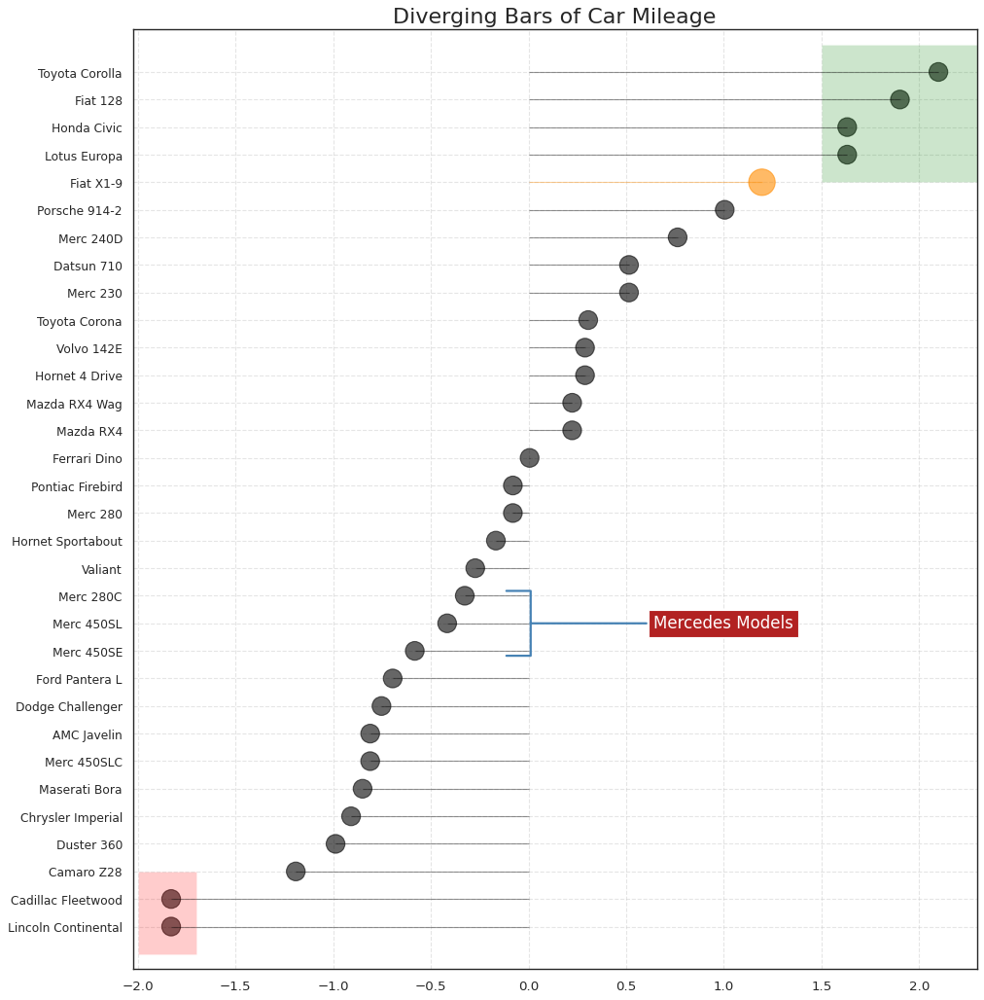

In [ ]:
# Prepare Data
df = pd.read_csv("https://github.com/selva86/datasets/raw/master/mtcars.csv")
x = df.loc[:, ['mpg']]
df['mpg_z'] = (x - x.mean())/x.std()
df['colors'] = 'black'

# color fiat differently
df.loc[df.cars == 'Fiat X1-9', 'colors'] = 'darkorange'
df.sort_values('mpg_z', inplace=True)
df.reset_index(inplace=True)


# Draw plot
import matplotlib.patches as patches

plt.figure(figsize=(14,16), dpi= 80)
plt.hlines(y=df.index, xmin=0, xmax=df.mpg_z, color=df.colors, alpha=0.4, linewidth=1)
plt.scatter(df.mpg_z, df.index, color=df.colors, s=[600 if x == 'Fiat X1-9' else 300 for x in df.cars], alpha=0.6)
plt.yticks(df.index, df.cars)
plt.xticks(fontsize=12)

# Annotate
plt.annotate('Mercedes Models', xy=(0.0, 11.0), xytext=(1.0, 11), xycoords='data', 
            fontsize=15, ha='center', va='center',
            bbox=dict(boxstyle='square', fc='firebrick'),
            arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1.5', lw=2.0, color='steelblue'), color='white')

# Add Patches
p1 = patches.Rectangle((-2.0, -1), width=.3, height=3, alpha=.2, facecolor='red')
p2 = patches.Rectangle((1.5, 27), width=.8, height=5, alpha=.2, facecolor='green')
plt.gca().add_patch(p1)
plt.gca().add_patch(p2)

# Decorate
plt.title('Diverging Bars of Car Mileage', fontdict={'size':20})
plt.grid(linestyle='--', alpha=0.5)
plt.show()


In [ ]:
import plotly.express as px
df = px.data.iris()
df["e_plus"] = df["sepal_width"]/100
df["e_minus"] = df["sepal_width"]/40
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species",
                 error_y="e_plus", error_y_minus="e_minus")
fig.show()

In [ ]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter(df, x="sepal_width", y="sepal_length", color="species",
                 size='petal_length', hover_data=['petal_width'])
fig.show()

image.png

## Catplot

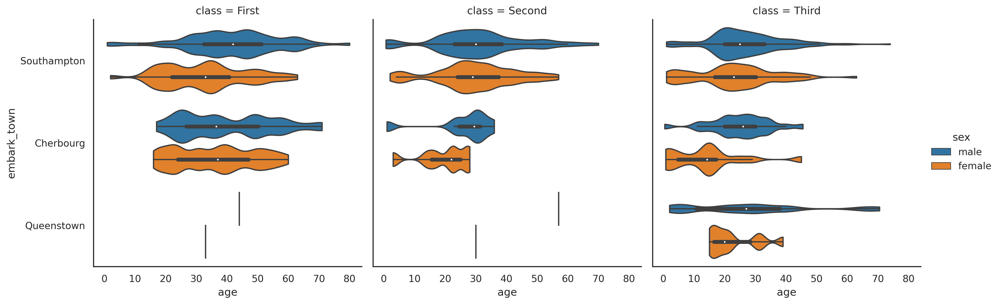

In [ ]:
# Load Dataset
titanic = sns.load_dataset("titanic")

# Plot
sns.catplot(x="age", y="embark_town",
            hue="sex", col="class",
            data=titanic[titanic.embark_town.notnull()],
            orient="h", height=5, aspect=1, palette="tab10",
            kind="violin", dodge=True, cut=0, bw=.2)

image.png

# <h1><left><font size=10><a name='link6'>7.0:Circular Plots</a></center>


## Sunburst Plots

### A sunburst chart is a type of data visualization that is used to display hierarchical data in a circular format. It is similar to a treemap or a tree diagram, but with a radial layout that makes it easier to see the overall structure of the data.

### In a sunburst chart, the outermost ring represents the top-level category or the root node of the hierarchy, while the inner rings represent the subcategories or child nodes. The size of each ring is proportional to the value of the data, and the color is used to differentiate between the subcategories or to represent a different variable.

### The sunburst chart is interactive and allows the user to drill down and explore the data by clicking on each segment, revealing the next level of subcategories. This makes it easy to see the overall structure of the data, and to identify patterns or trends in the data that may not be apparent in other types of visualizations.

### Sunburst charts are commonly used to visualize hierarchical data, such as organizational structures, file systems, or product categories. They can be an effective tool for communicating complex information to a broad audience, and for exploring the relationships between different variables in the data.

### When do we use Sunburst Charts

### Sunburst charts are particularly useful when we want to visualize hierarchical data in a compact and easy-to-understand format. Here are some examples of situations where sunburst charts may be useful:

### `Organizational structures`: Sunburst charts can be used to represent the hierarchy of departments or teams within an organization, making it easy to understand the overall structure and relationships between different departments or teams.

### `Product categories`: Sunburst charts can be used to represent the categories of products sold by a company or a retailer, making it easy to understand the relationships between different product categories and subcategories.

### `File systems`: Sunburst charts can be used to represent the file systems of a computer, making it easy to understand the overall structure of the files and folders, and to drill down to individual files and folders.

### `Financial data`: Sunburst charts can be used to represent the different levels of financial data, such as revenue, expenses, and profits, making it easy to understand the relationship between different categories of financial data.

### `Note`

### In general, sunburst charts can be useful in any situation where we need to represent hierarchical data in a compact and easy-to-understand format. They are particularly effective for interactive data exploration and analysis, where users can click on different segments of the chart to drill down into the data and explore the relationships between different variables.

### Advantages

### They are effective for visualizing hierarchical data in a compact and easy-to-understand format, making it easy to see the overall structure of the data and the relationships between different categories and subcategories.

### They are interactive, allowing users to drill down into the data and explore the relationships between different variables, making them an effective tool for data exploration and analysis.

### They can be visually appealing and can effectively communicate complex information to a broad audience.

### Disadvantages

### They can be difficult to interpret accurately if the hierarchy is too complex, making it challenging to identify specific relationships between categories or subcategories.

### They may not be suitable for displaying large amounts of data, as the visual clutter can make it challenging to interpret the data accurately.

### They can be misleading if the segments of the chart are not proportional to the value of the data, or if the colors are not used effectively to differentiate between different categories or subcategories.

### `Note`

### In summary, while sunburst charts can be an effective tool for visualizing hierarchical data, it's essential to consider their limitations and ensure that the data is suitable for this type of visualization before using it. It's also important to use effective design principles, such as appropriate color choices and clear labeling, to ensure that the chart is easy to interpret accurately.





### Practical Applications of :Sunburst Charts

##### `Distribution of Day of the Week, time Sex and Total Bills`

In [ ]:
import plotly.express as px
df = px.data.tips()
df.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


<IPython.core.display.Javascript object>

In [ ]:

df.groupby(['day','time','sex'])['total_bill'].count().sort_values(ascending = False).head()

day   time    sex   
Sat   Dinner  Male      59
Sun   Dinner  Male      58
Thur  Lunch   Female    31
              Male      30
Sat   Dinner  Female    28
Name: total_bill, dtype: int64

<IPython.core.display.Javascript object>

In [ ]:
# Sunburst of a rectangular DataFrame
import plotly.express as px
fig = px.sunburst(df, path=['day', 'time', 'sex'], values='total_bill')
fig.show()

<IPython.core.display.Javascript object>

image.png

#### `Distribution of Day, Smoker, Sex and Total Bills`

In [ ]:

df.groupby(['day','smoker','sex'])['total_bill'].count().sort_values(ascending = False).head()

day   smoker  sex   
Sun   No      Male      43
Sat   No      Male      32
      Yes     Male      27
Thur  No      Female    25
              Male      20
Name: total_bill, dtype: int64

<IPython.core.display.Javascript object>

In [ ]:
# Sunburst of a rectangular DataFrame
import plotly.express as px
fig = px.sunburst(df, path=['day', 'smoker', 'sex'], values='total_bill')
fig.show()

<IPython.core.display.Javascript object>

image.png

In [ ]:
# Sunburst of a rectangular DataFrame with discrete color argument in px.sunburst
import plotly.express as px
fig = px.sunburst(df, path=['sex', 'day', 'time'], values='total_bill', color='time')
fig.show()

image.png

In [ ]:
# Sunburst of a rectangular DataFrame with discrete color argument in px.sunburst
import plotly.express as px
fig = px.sunburst(df, path=['sex', 'day', 'time'], values='total_bill', color='sex')
fig.show()

image.png

In [ ]:
import plotly.express as px
fig = px.sunburst(df, path=['sex', 'day', 'time'], values='total_bill', color='time',
                  color_discrete_map={'(?)':'black', 'Lunch':'gold', 'Dinner':'darkblue'})
fig.show()

image.png

In [ ]:
import plotly.express as px
fig = px.sunburst(df, path=['sex', 'day', 'time'], values='total_bill', color='time',
                  color_discrete_map={'(?)':'red', 'Lunch':'gold', 'Dinner':'green'})
fig.show()

image.png

In [ ]:
import plotly.express as px
fig = px.sunburst(df, path=['sex', 'day', 'smoker'], values='total_bill')
fig.show()

#### `Distribution of Countries and their GDP, Life Expetancy, Population etc.`

In [ ]:
f = px.data.gapminder()
f.head(4)

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4


In [ ]:
f.shape

(1704, 8)

In [ ]:
import plotly.express as px

df = px.data.gapminder().query("year == 2007")
fig = px.sunburst(df, path=['continent', 'country'], values='pop',
                  color='lifeExp', hover_data=['iso_alpha'])
fig.show()

In [ ]:
import plotly.express as px
import numpy as np
df = px.data.gapminder().query("year == 2007")
fig = px.treemap(df, path=[px.Constant('world'), 'continent', 'country'], values='pop',
                  color='lifeExp', hover_data=['iso_alpha'])
fig.show()


In [ ]:
import plotly.express as px
import numpy as np
df = px.data.gapminder().query("year == 2007")
fig = px.icicle(df, path=[px.Constant('world'), 'continent', 'country'], values='pop',
                  color='lifeExp', hover_data=['iso_alpha'])
fig.show()

image.png

In [ ]:
import plotly.graph_objects as go
import pandas as pd


In [ ]:
df1 = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/718417069ead87650b90472464c7565dc8c2cb1c/sunburst-coffee-flavors-complete.csv')
df2 = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/718417069ead87650b90472464c7565dc8c2cb1c/coffee-flavors.csv')

In [ ]:
fig = go.Figure()

fig.add_trace(go.Sunburst(
    ids=df1.ids,
    labels=df1.labels,
    parents=df1.parents,
    domain=dict(column=0)
))

fig.add_trace(go.Sunburst(
    ids=df2.ids,
    labels=df2.labels,
    parents=df2.parents,
    domain=dict(column=1),
    maxdepth=2
))

fig.update_layout(
    grid= dict(columns=2, rows=1),
    margin = dict(t=0, l=0, r=0, b=0)
)

fig.show()

image.png

## Pie Chart

### A pie chart is a circular data visualization that is used to display data as a proportion or percentage of the whole. It is divided into sectors, or "slices," which represent different categories or values. Each slice is proportional to the value it represents, and the total of all slices represents the whole data set.

### Pie charts are commonly used to represent data that is divided into a small number of categories, typically no more than six or seven. They are particularly useful for displaying data that is easy to understand at a glance, such as market share, budget allocation, or demographic data.

### Pie charts are simple and easy to read, making them an effective tool for communicating data to a broad audience. They can also be effective for comparing the relative proportions of different categories, as the slices are easily comparable in size.

### However, pie charts do have some limitations. They can be difficult to read accurately if the number of categories is too large or if the differences in value between categories are too small. In addition, they can be misleading if the slices are not proportional to the value of the data or if the colors used to differentiate between slices are not used effectively.

### `Note`

### In summary, pie charts are a useful tool for displaying data as a proportion or percentage of the whole, particularly when the number of categories is small and the differences in value between categories are large. However, it's important to consider the limitations of pie charts and to use them appropriately to ensure that they effectively communicate the data to the intended audience.

### When do we use Pie Charts

### Pie charts are most effective when they are used to display data that is divided into a small number of categories, typically no more than six or seven. They are commonly used in situations where it is essential to represent data as a proportion or percentage of the whole. Here are some examples of situations where pie charts may be useful:

- ### `Market share`: Pie charts can be used to represent the market share of different companies or products in a particular market, making it easy to understand the relative proportions of each company's share.

- ### `Budget allocation`: Pie charts can be used to represent the allocation of funds in a budget, making it easy to understand the relative proportions of the funds allocated to different categories, such as salaries, operations, and marketing.

- ### `Demographic data`: Pie charts can be used to represent the demographic composition of a population, making it easy to understand the relative proportions of different age groups, genders, or ethnicities.

- ### `Survey results`: Pie charts can be used to represent the results of a survey, making it easy to understand the percentage of respondents who answered a particular way.

### `Note`

### In general, pie charts are most effective when the data is straightforward and easy to understand, and when it is essential to represent the data as a proportion or percentage of the whole. It's important to use them appropriately and to consider the limitations of pie charts to ensure that they effectively communicate the data to the intended audience.

### Advantagee

- ### They are simple and easy to understand, making them an effective tool for communicating data to a broad audience.

- ### They are visually appealing and can be used to emphasize key data points.

- ### They are effective for displaying data as a proportion or percentage of the whole.

### Disadvantages


- ### They can be difficult to read accurately if the number of categories is too large or if the differences in value between categories are too small.

- ### They can be misleading if the slices are not proportional to the value of the data or if the colors used to differentiate between slices are not used effectively.

- ### They are not effective for displaying raw data or absolute values.

### `Note`

### In general, pie charts are most effective when the data is straightforward and easy to understand, and when it is essential to represent the data as a proportion or percentage of the whole. It's important to use them appropriately and to consider the limitations of pie charts to ensure that they effectively communicate the data to the intended audience. In situations where the data is complex or difficult to understand, other types of charts or graphs may be more appropriate.

### Aplications of Pie Charts

#### `Pie Chart and Tree Map Showing a Class of Vehicles`

In [ ]:
import pandas as pd
url="https://raw.githubusercontent.com/hayfordosmandata/DataBank/main/mpg_ggplot2.csv"
df=pd.read_csv(url, encoding="unicode_escape")

# First 4 rows of the dataset
df.head(4)

,manufacturer,model,displ,year,cyl,trans,drv,cty,hwy,fl,class
0,audi,a4,1.8,1999,4,auto(l5),f,18,29,p,compact
1,audi,a4,1.8,1999,4,manual(m5),f,21,29,p,compact
2,audi,a4,2.0,2008,4,manual(m6),f,20,31,p,compact
3,audi,a4,2.0,2008,4,auto(av),f,21,30,p,compact


<IPython.core.display.Javascript object>

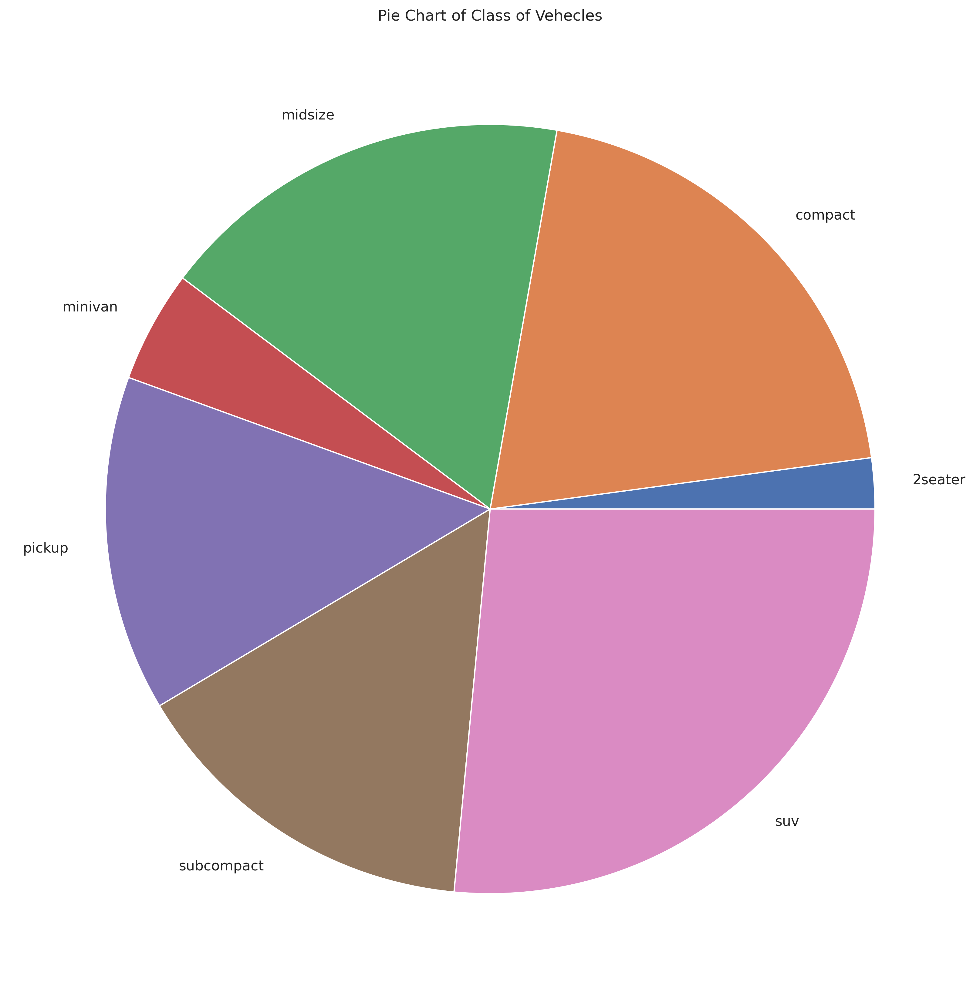

<IPython.core.display.Javascript object>

In [ ]:
# Pie Chart of Class of Vehicles
data = df.groupby('class').size()
# Make the plot with pandas
data.plot(kind='pie', subplots=True, figsize=(25, 14))
plt.title("Pie Chart of Class of Vehecles")
plt.ylabel("")
plt.show()

image.png

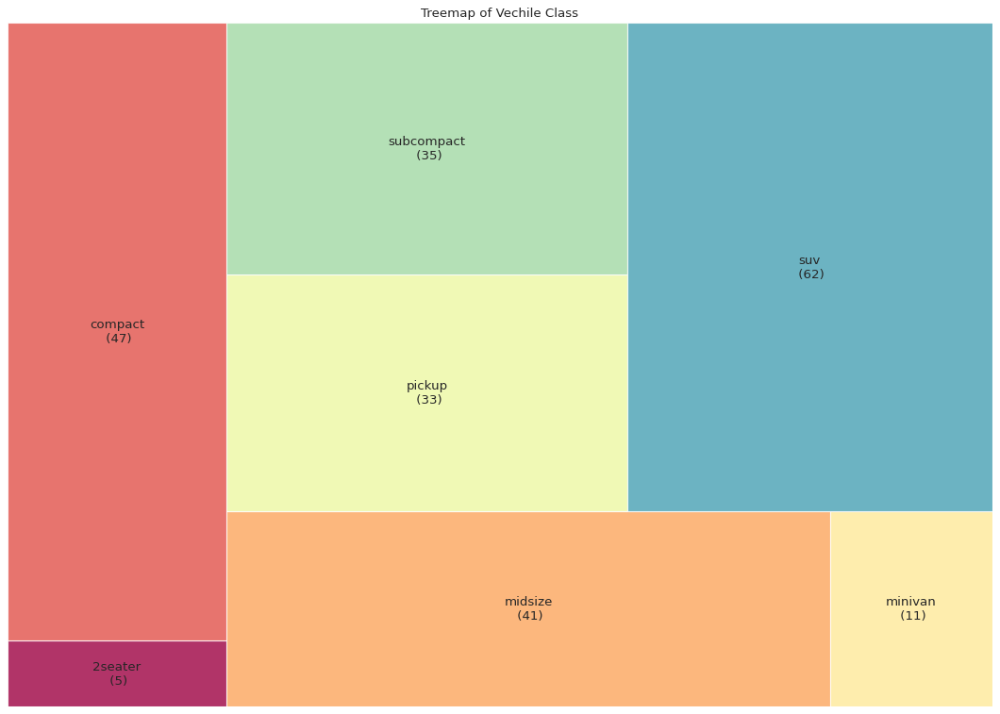

<IPython.core.display.Javascript object>

In [ ]:
# pip install squarify
import squarify 
data = df.groupby('class').size().reset_index(name='counts')
labels = data.apply(lambda x: str(x[0]) + "\n (" + str(x[1]) + ")", axis=1)
sizes = data['counts'].values.tolist()
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]

# Draw Plot
plt.figure(figsize=(15,12), dpi= 80)
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=.8)

# Decorate
plt.title('Treemap of Vechile Class')
plt.axis('off')
plt.show()

image.png

In [ ]:
# Using Gapminder 
df= px.data.gapminder().head()
df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4


<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px
df = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
df.loc[df['pop'] < 2.e6, 'country'] = 'Other countries' # Represent only large countries
fig = px.pie(df, values='pop', names='country', title='Population of European continent')
fig.show()

<IPython.core.display.Javascript object>

image.png

## Bar Charts

### A bar chart is a graphical representation of data in which bars of equal width are used to represent the values of a set of variables. The height of each bar is proportional to the value it represents. Bar charts are commonly used to compare the relative sizes of different categories or groups.

### Bar charts are often used in data visualization to help people quickly understand complex data sets. They are easy to read and can be used to illustrate trends over time, compare values between different categories or groups, and highlight outliers or unusual data points.

### Bar charts can be created using a variety of software tools, including spreadsheet programs like Microsoft Excel, as well as specialized data visualization software like Tableau and Power BI. There are also many online tools and libraries that allow you to create interactive and dynamic bar charts.


### Advantages

### Bar charts have several advantages and disadvantages that should be considered when deciding whether to use them to represent data. Here are some of the key advantages and disadvantages of using bar charts:

#### Advantages:

- ### `Easy to read`: Bar charts are a simple and straightforward way to present data. The bars make it easy to compare values and see trends over time or across different categories.

- ### `Visually appealing`: Bar charts can be visually appealing and can help to draw attention to important data or trends.

- ### `Flexible`: Bar charts can be used to represent many different types of data, including categorical, numerical, and ordinal data.

- ### `Widely recognized`: Bar charts are a common and widely recognized type of chart, making them easy for viewers to understand and interpret.

### Disadvantages

### Disadvantages:

- ### `Limited detail`: Bar charts may not be suitable for data that requires a more detailed analysis or for data that contains many variables or categories.

- ### `Can be misleading`: If the bars are not properly scaled or if the axis is manipulated, bar charts can be misleading and misrepresent the data.

- ### `Limited use for continuous data`: Bar charts are not always the best choice for continuous data or data that is highly variable.

- ### `Limited space for labels`: If the labels for the categories or bars are long, it may be difficult to fit them onto the chart, which can make the chart harder to read.

### Overall, bar charts are a useful tool for representing data, but they may not always be the best choice depending on the type of data being presented and the goals of the analysis. It is important to consider the advantages and disadvantages of using bar charts, as well as other types of charts, before deciding which chart to use.

In [ ]:
import plotly.express as px
df = px.data.medals_long()

fig = px.bar(df, x="medal", y="count", color="nation",
             pattern_shape="nation", pattern_shape_sequence=[".", "x", "+"])
fig.show()

In [ ]:
import plotly.express as px
data_canada = px.data.gapminder().query("country == 'Canada'")
fig = px.bar(data_canada, x='year', y='pop')
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
long_df = px.data.medals_long()
long_df.head()

,nation,medal,count
0,South Korea,gold,24
1,China,gold,10
2,Canada,gold,9
3,South Korea,silver,13
4,China,silver,15


<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px

long_df = px.data.medals_long()

fig = px.bar(long_df, x="nation", y="count", color="medal", title="Long-Form Input")
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px

wide_df = px.data.medals_wide()

fig = px.bar(wide_df, x="nation", y=["gold", "silver", "bronze"], title="Wide-Form Input")
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px

df = px.data.gapminder().query("country == 'Canada'")
fig = px.bar(df, x='year', y='pop',
             hover_data=['lifeExp', 'gdpPercap'], color='lifeExp',
             labels={'pop':'population of Canada'}, height=400)
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px

df = px.data.gapminder().query("continent == 'Oceania'")
fig = px.bar(df, x='year', y='pop',
             hover_data=['lifeExp', 'gdpPercap'], color='country',
             labels={'pop':'population of Canada'}, height=400)
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px
df = px.data.tips()
fig = px.bar(df, x="sex", y="total_bill", color='time')
fig.show()


<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px
df = px.data.tips()
fig = px.bar(df, x="sex", y="total_bill",
             color='smoker', barmode='group',
             height=400)
fig.show()


<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px
df = px.data.tips()
fig = px.histogram(df, x="sex", y="total_bill",
             color='smoker', barmode='group',
             height=400)
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px
df = px.data.tips()
fig = px.histogram(df, x="sex", y="total_bill",
             color='smoker', barmode='group',
             histfunc='avg',
             height=400)
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px
df = px.data.medals_long()

fig = px.bar(df, x="medal", y="count", color="nation", text_auto=True)
fig.show()


<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px
df = px.data.medals_long()

fig = px.bar(df, x="medal", y="count", color="nation", text="nation")
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px

df = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig = px.bar(df, y='pop', x='country', text_auto='.2s',
            title="Default: various text sizes, positions and angles")
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px

df = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig = px.bar(df, y='pop', x='country', text_auto='.2s',
            title="Controlled text sizes, positions and angles")
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px
df = px.data.medals_long()

fig = px.bar(df, x="medal", y="count", color="nation",
             pattern_shape="nation", pattern_shape_sequence=[".", "x", "+"])
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px
df = px.data.tips()
fig = px.bar(df, x="sex", y="total_bill", color="smoker", barmode="group",
             facet_row="time", facet_col="day",
             category_orders={"day": ["Thur", "Fri", "Sat", "Sun"],
                              "time": ["Lunch", "Dinner"]})
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.graph_objects as go
animals=['giraffes', 'orangutans', 'monkeys']

fig = go.Figure([go.Bar(x=animals, y=[20, 14, 23])])
fig.show()

<IPython.core.display.Javascript object>

In [ ]:
import plotly.graph_objects as go

years = ['2016','2017','2018']

fig = go.Figure()
fig.add_trace(go.Bar(x=years, y=[500, 600, 700],
                base=[-500,-600,-700],
                marker_color='crimson',
                name='expenses'))
fig.add_trace(go.Bar(x=years, y=[300, 400, 700],
                base=0,
                marker_color='lightslategrey',
                name='revenue'
                ))

fig.show()

<IPython.core.display.Javascript object>

## Radar Charts in Matplotlib

###  A  radar chart, also known as a spider chart or a star chart, is a graphical representation of data that displays multivariate data in the form of a two-dimensional chart. It is called a radar chart because the chart's appearance resembles a radar screen, with each variable being represented by a spoke or axis that originates from the center point of the chart.

### In a radar chart, each axis represents a different variable, and the data points for each variable are plotted along their respective axes. The resulting shape formed by the data points can provide insight into the relationship between the variables, and can be useful for visualizing patterns, trends, and outliers in the data.

### Radar charts are often used in fields such as business, engineering, and sports to display and compare data from multiple sources. They can also be used in market research to display customer preferences, in performance evaluations to display employee performance, and in environmental studies to display the impact of different factors on the environment. 

### When do we use Radar Charts

### Radar charts can be used to visualize and compare multiple variables, making them useful in situations where it is necessary to display data in a comprehensive and easily understandable way. Here are a few specific situations where radar charts may be useful:

- ### `Performance evaluation`: Radar charts can be used to evaluate and compare the performance of multiple individuals or teams. By plotting different performance metrics on each axis, you can quickly see which individuals or teams are performing well in certain areas and which ones need improvement.

- ### `Marketing`: Radar charts can be used to display the preferences and opinions of customers. By plotting different features or attributes of a product on each axis, you can quickly see which features are most important to customers and how they compare to those of competing products.

- ### `Environmental studies`: Radar charts can be used to display the impact of multiple factors on the environment. By plotting different environmental factors on each axis, you can see which factors have the greatest impact on the environment and how they interact with each other.

- ### Sports analysis`: Radar charts can be used to compare the performance of athletes in different areas, such as speed, strength, and agility. By plotting each athlete's performance on each axis, you can quickly see which athletes excel in certain areas and which ones need improvement.

### Overall, radar charts can be useful in any situation where it is necessary to display and compare multiple variables in a clear and concise way.

### Advantages

### Advantages of using radar charts include:

- ### `Visualizing multiple variables`: Radar charts are useful for visualizing and comparing multiple variables, which makes them a valuable tool in fields such as business, sports, and engineering.

- ### `Highlighting strengths and weaknesses`: Radar charts make it easy to identify the strengths and weaknesses of a particular entity, such as an individual, team, or product. By highlighting these strengths and weaknesses, it is easier to take action to improve performance.

- ### `Providing a quick overview`: Radar charts provide a quick and easy-to-understand overview of the data. They allow you to identify patterns, trends, and outliers at a glance.

- ### `Facilitating comparisons`: Radar charts are effective for comparing data across different groups or time periods. By plotting the data on the same chart, it is easy to compare the performance of different entities over time.

### Disadvantages

### Disadvantages of using radar charts include:

- ### `Difficulty with large data sets`: Radar charts can become cluttered and difficult to read with large data sets, which can make it hard to identify patterns or outliers.

- ### `Subjectivity`: The interpretation of radar charts can be subjective, and different people may interpret the same chart differently.

- ### `Limited use with non-scalar data`: Radar charts are designed for use with scalar data, and may not be effective for visualizing non-scalar data.

- ### `Limited use for statistical analysis`: Radar charts do not allow for advanced statistical analysis, such as regression analysis, which may be necessary in some applications.

### Overall, radar charts are a valuable tool for visualizing and comparing multiple variables, but they have some limitations and may not be appropriate in all situations.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# For our sample data.
from vega_datasets import data


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# For our sample data.
from vega_datasets import data

In [ ]:
df=data.cars()

In [ ]:
df.head()

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1970-01-01,USA
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1970-01-01,USA
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1970-01-01,USA
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1970-01-01,USA
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1970-01-01,USA


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
# For our sample data.
from vega_datasets import data

In [ ]:
df.head()

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1970-01-01,USA
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1970-01-01,USA
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1970-01-01,USA
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1970-01-01,USA
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1970-01-01,USA


In [ ]:
# The attributes we want to use in our radar plot.
factors = ['Acceleration', 'Displacement', 'Horsepower',
           'Miles_per_Gallon', 'Weight_in_lbs']

# New scale should be from 0 to 100.
new_max = 100
new_min = 0
new_range = new_max - new_min

# Do a linear transformation on each variable to change value
# to [0, 100].
for factor in factors:
  max_val = df[factor].max()
  min_val = df[factor].min()
  val_range = max_val - min_val
  df[factor + '_Adj'] = df[factor].apply(
      lambda x: (((x - min_val) * new_range) / val_range) + new_min)


# Add the year to the name of the car to differentiate between
# the same model.
df['Car Model'] = df.apply(lambda row: '{} {}'.format(row.Name, row.Year.year), axis=1)

# Trim down to cols we want and rename to be nicer.
dft = df.loc[:, ['Car Model', 'Acceleration_Adj', 'Displacement_Adj',
                 'Horsepower_Adj', 'Miles_per_Gallon_Adj',
                 'Weight_in_lbs_Adj']]

dft.rename(columns={
    'Acceleration_Adj': 'Acceleration',
    'Displacement_Adj': 'Displacement',
    'Horsepower_Adj': 'Horsepower',
    'Miles_per_Gallon_Adj': 'MPG',
    'Weight_in_lbs_Adj': 'Weight'
}, inplace=True)

dft.set_index('Car Model', inplace=True)

dft.head()

,Acceleration,Displacement,Horsepower,MPG,Weight
Car Model,,,,,
chevrolet chevelle malibu 1970,23.809524,61.757106,45.652174,23.936170,53.614970
buick skylark 320 1970,20.833333,72.868217,64.673913,15.957447,58.973632
plymouth satellite 1970,17.857143,64.599483,56.521739,23.936170,51.686986
amc rebel sst 1970,23.809524,60.981912,56.521739,18.617021,51.601928
ford torino 1970,14.880952,60.465116,51.086957,21.276596,52.055571


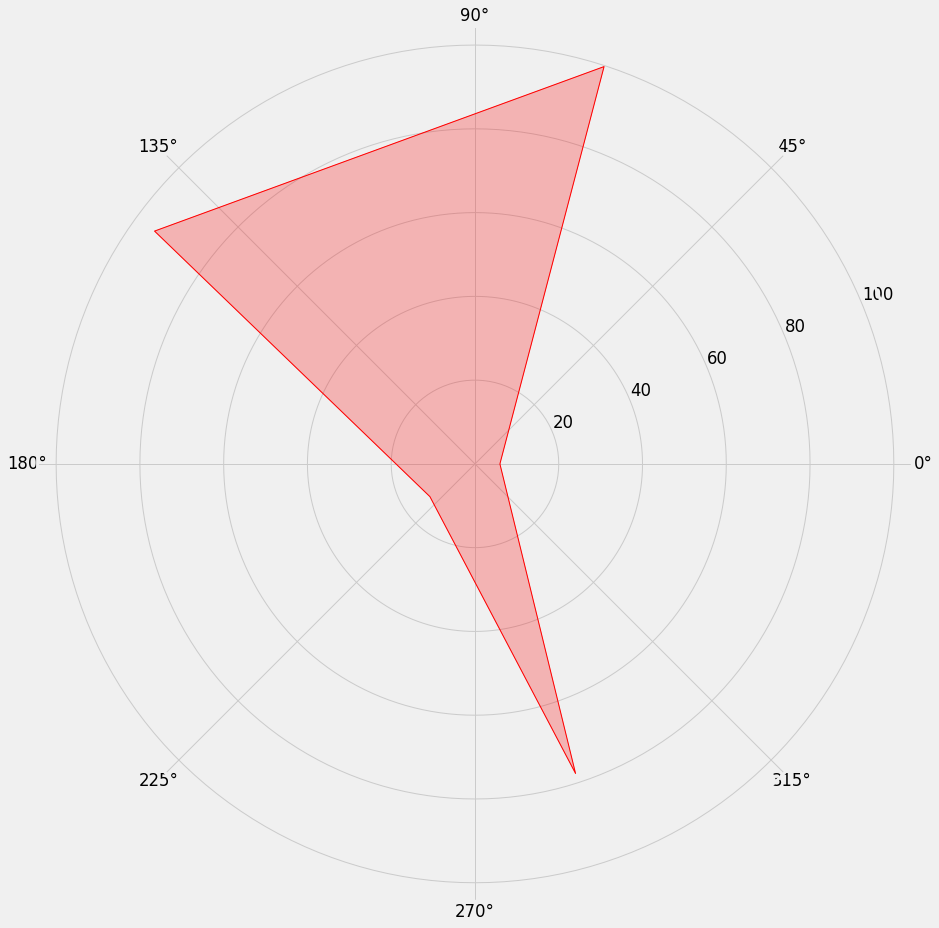

In [ ]:
# Each attribute we'll plot in the radar chart.
labels = ['Acceleration', 'Displacement', 'Horsepower', 'MPG', 'Weight']

# Let's look at the 1970 Chevy Impala and plot it.
values = dft.loc['chevrolet impala 1970'].tolist()

# Number of variables we're plotting.
num_vars = len(labels)

# Split the circle into even parts and save the angles
# so we know where to put each axis.
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is a circle, so we need to "complete the loop"
# and append the start value to the end.
values += values[:1]
angles += angles[:1]

# ax = plt.subplot(polar=True)
fig, ax = plt.subplots(figsize=(30, 15), subplot_kw=dict(polar=True))

# Draw the outline of our data.
ax.plot(angles, values, color='red', linewidth=1)
# Fill it in.
ax.fill(angles, values, color='red', alpha=0.25);

image.png

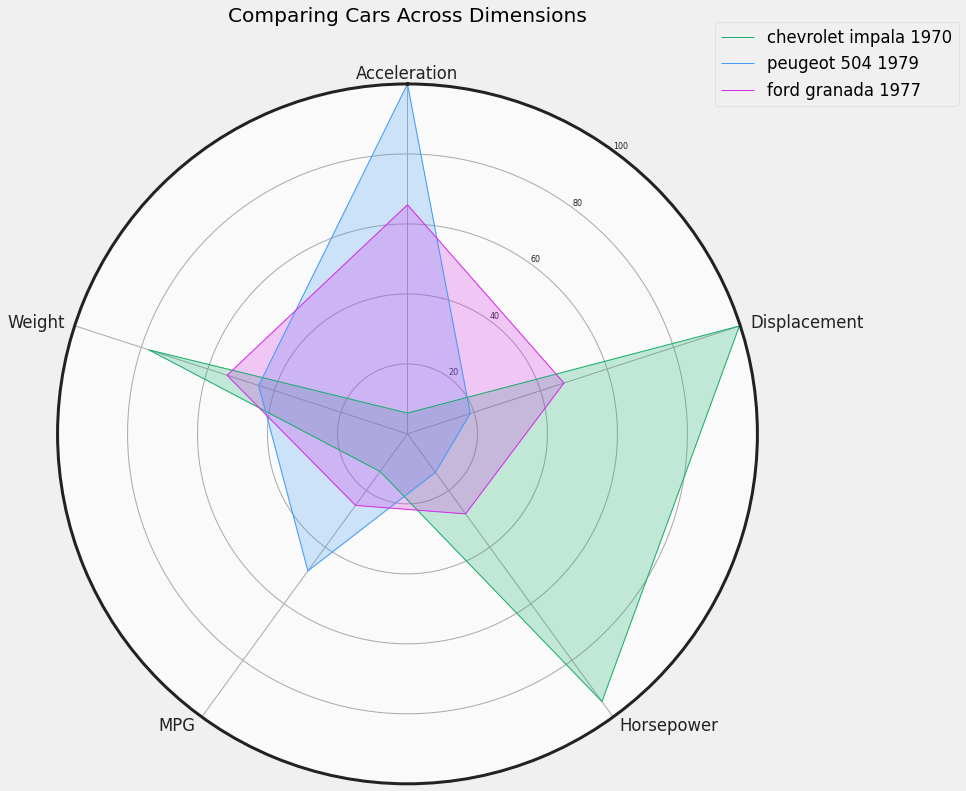

In [ ]:
# Each attribute we'll plot in the radar chart.
labels = ['Acceleration', 'Displacement', 'Horsepower', 'MPG', 'Weight']

# Number of variables we're plotting.
num_vars = len(labels)

# Split the circle into even parts and save the angles
# so we know where to put each axis.
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is a circle, so we need to "complete the loop"
# and append the start value to the end.
angles += angles[:1]

# ax = plt.subplot(polar=True)
fig, ax = plt.subplots(figsize=(25, 12), subplot_kw=dict(polar=True))

# Helper function to plot each car on the radar chart.
def add_to_radar(car_model, color):
  values = dft.loc[car_model].tolist()
  values += values[:1]
  ax.plot(angles, values, color=color, linewidth=1, label=car_model)
  ax.fill(angles, values, color=color, alpha=0.25)

# Add each car to the chart.
add_to_radar('chevrolet impala 1970', '#1aaf6c')
add_to_radar('peugeot 504 1979', '#429bf4')
add_to_radar('ford granada 1977', '#d42cea')

# Fix axis to go in the right order and start at 12 o'clock.
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)

# Draw axis lines for each angle and label.
ax.set_thetagrids(np.degrees(angles), labels)

# Go through labels and adjust alignment based on where
# it is in the circle.
for label, angle in zip(ax.get_xticklabels(), angles):
  if angle in (0, np.pi):
    label.set_horizontalalignment('center')
  elif 0 < angle < np.pi:
    label.set_horizontalalignment('left')
  else:
    label.set_horizontalalignment('right')

# Ensure radar goes from 0 to 100.
ax.set_ylim(0, 100)
# You can also set gridlines manually like this:
# ax.set_rgrids([20, 40, 60, 80, 100])

# Set position of y-labels (0-100) to be in the middle
# of the first two axes.
ax.set_rlabel_position(180 / num_vars)

# Add some custom styling.
# Change the color of the tick labels.
ax.tick_params(colors='#222222')
# Make the y-axis (0-100) labels smaller.
ax.tick_params(axis='y', labelsize=8)
# Change the color of the circular gridlines.
ax.grid(color='#AAAAAA')
# Change the color of the outermost gridline (the spine).
ax.spines['polar'].set_color('#222222')
# Change the background color inside the circle itself.
ax.set_facecolor('#FAFAFA')

# Add title.
ax.set_title('Comparing Cars Across Dimensions', y=1.08)

# Add a legend as well.
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

## Polar Charts

### Polar charts, also known as polar area charts or rose charts, are a type of chart used to display multivariate data. They are similar to radar charts in that they use a circular axis system, but polar charts typically use a single axis that is divided into multiple sectors, with each sector representing a different variable.

### In a polar chart, the values for each variable are plotted as a series of data points around the circular axis. The data points are connected by lines, and the area enclosed by the lines is filled in to create a polar area chart. The resulting shape formed by the data points can provide insight into the relationship between the variables, and can be useful for visualizing patterns, trends, and outliers in the data.

### Polar charts are often used to display data with cyclical patterns, such as weather data or economic data that varies by season. They can also be used in fields such as engineering and biology to display data with a circular or radial structure, such as the distribution of plant species or the structural properties of materials.

### When do we use Polar Charts

### Polar charts are useful for visualizing multivariate data that have a circular or cyclical structure. Here are a few specific situations where polar charts may be useful:

- ### `Weather data`: Polar charts can be used to display weather data, such as temperature, wind speed, and precipitation, that varies by season. The circular axis of the chart represents the year, and each sector represents a month or season. By plotting the data on a polar chart, it is easy to identify seasonal patterns and trends.

- ### Economic data`: Polar charts can be used to display economic data that varies by season, such as sales data for a particular product or service. By plotting the data on a polar chart, it is easy to identify seasonal trends and patterns, which can be used to inform marketing or production strategies.

- ### `Material properties`: Polar charts can be used in fields such as engineering and biology to display data with a circular or radial structure, such as the distribution of plant species or the structural properties of materials. By plotting the data on a polar chart, it is easy to identify patterns and trends in the data, which can be used to inform research and development.

- ### `Survey data`: Polar charts can be used to display survey data that is measured on a scale with circular or cyclical properties, such as a Likert scale. By plotting the data on a polar chart, it is easy to identify patterns in the responses and to compare the responses of different groups.

### Overall, polar charts are a useful tool for visualizing multivariate data with a circular or cyclical structure, and can be used in a wide range of applications.

### Advantages

### Advantages of using polar charts include:

- ### `Highlighting cyclical or seasonal patterns`: Polar charts are particularly useful for displaying data that has a cyclical or seasonal structure, such as weather data, economic data, or survey data. By plotting the data on a circular axis, it is easy to identify patterns and trends in the data.

- ### `Displaying multiple variables`: Polar charts can display multiple variables on the same chart, which makes them useful for comparing and contrasting different sets of data.

- ### `Providing a visual summary`: Polar charts can provide a visual summary of complex data, making it easy to communicate the key insights to others. They are particularly useful in situations where the data is complex or difficult to interpret.

- ### `Supporting clear and concise communication`: Polar charts can help to convey information in a clear and concise manner, which is particularly useful in situations where time is limited or the audience has limited knowledge of the subject matter.

### Disadvantages

### Disadvantages of using polar charts include:

- ### `Difficulty with large data sets`: Polar charts can become cluttered and difficult to read with large data sets, which can make it hard to identify patterns or outliers.

- ### `Limited use for non-circular data`: Polar charts are designed for use with circular or cyclical data, and may not be effective for visualizing non-circular data.

- ### `Limited use for statistical analysis`: Polar charts do not allow for advanced statistical analysis, such as regression analysis, which may be necessary in some applications.

- ### `Subjectivity`: The interpretation of polar charts can be subjective, and different people may interpret the same chart differently.

### Overall, polar charts are a valuable tool for visualizing data that has a circular or cyclical structure, but they have some limitations and may not be appropriate in all situations. It is important to carefully consider the data and the audience before deciding to

In [ ]:
df = px.data.wind().head()
df

,direction,strength,frequency
0,N,0-1,0.5
1,NNE,0-1,0.6
2,NE,0-1,0.5
3,ENE,0-1,0.4
4,E,0-1,0.4


In [ ]:
import plotly.express as px
df = px.data.wind()
fig = px.scatter_polar(df, r="frequency", theta="direction", color="strength", symbol="strength",
            color_discrete_sequence=px.colors.sequential.Plasma_r)
fig.show()

In [ ]:
import plotly.express as px
df = px.data.wind()
fig = px.line_polar(df, r="frequency", theta="direction", color="strength", line_close=True,
            color_discrete_sequence=px.colors.sequential.Plasma_r)
fig.show()

In [ ]:
import plotly.express as px
df = px.data.wind()
fig = px.bar_polar(df, r="frequency", theta="direction", color="strength", template="plotly_dark",
            color_discrete_sequence= px.colors.sequential.Plasma_r)
fig.show()

image.png

# <h1><left><font size=10><a name='link6'> 7.0:Time Seris and Lines Plots</a></center></font></h1>

## Time Series Plots

### Time series plots are graphs that display data over time, with time plotted on the horizontal axis and the variable of interest plotted on the vertical axis. In other words, time series plots show how a variable changes over time.

### Time series plots can be used to visualize many types of data, including economic indicators, stock prices, weather patterns, and more. These plots are particularly useful for identifying trends, seasonal patterns, and other patterns in the data that may not be apparent from a simple table of numbers.

### A basic time series plot typically displays a single variable over time, with each observation plotted as a point. However, more complex time series plots can include multiple variables or multiple time series on a single plot, and can incorporate additional information such as confidence intervals, moving averages, or other statistical summaries.

### When do we use Time Series Plots

### Time series plots are commonly used in many different fields to analyze and visualize data that changes over time. Here are a few examples of situations in which time series plots are often used:


- ### `Economic Analysis`: Time series plots are widely used in economics to analyze economic indicators such as GDP, unemployment rates, inflation rates, and stock prices over time. These plots can help identify trends, cycles, and seasonal patterns in the data, and can be used to forecast future economic conditions.

- ### `Financial Analysis`: Time series plots can be used in financial analysis to visualize stock prices, trading volumes, and other financial metrics over time. These plots can help identify trends, patterns, and potential market trends that can inform investment decisions.

- ### `Environmental Monitoring`: Time series plots can be used to track changes in environmental factors over time, such as temperature, rainfall, and atmospheric conditions. These plots can help identify long-term trends, seasonal patterns, and other factors that may affect the environment.

- ### `Health Monitoring`: Time series plots can be used in healthcare to monitor patient health over time. For example, a time series plot of a patient's blood glucose levels can help identify patterns or trends that may indicate a need for treatment adjustments.

- ### `Industrial Process Control`: Time series plots can be used in manufacturing and industrial settings to monitor production processes over time. These plots can help identify trends and patterns in process data, and can be used to improve product quality and reduce waste.

### Overall, time series plots can be used whenever you have data that changes over time and you want to visualize and analyze that data in a meaningful way.

### Advantages

### Advantages of Time Series Plots:

- ### `Identify Trends`: Time series plots help to identify patterns and trends in data over time that may not be evident from a simple table of numbers. This can be useful for identifying long-term trends, seasonal patterns, and other factors that may be important for forecasting or decision-making.

- ### `Easy to Understand`: Time series plots are typically easy to understand, even for people who are not trained in statistical analysis. They provide a clear visual representation of data over time that can help communicate complex ideas to a wide audience.

- ### `Identify Outliers`: Time series plots can also help to identify outliers or unusual data points that may be important for further investigation. These outliers can provide insights into unexpected changes in the data or errors in data collection.

- ### `Forecasting`: Time series plots can be used to predict future values of a variable based on past data. This can be particularly useful in fields such as finance, where forecasting is important for making investment decisions.

### Disadvanatages

### Disadvantages of Time Series Plots:

- ### `Data Quality`: The accuracy of time series plots depends on the quality of the data used to create them. If the data is incomplete or contains errors, the resulting plots may be inaccurate or misleading.

- ### `Limited Insight`: While time series plots are useful for identifying trends and patterns, they may not provide insights into the underlying causes of those patterns. To gain a more complete understanding of the data, it may be necessary to perform additional analysis or collect additional data.

- ### `Overfitting`: Time series plots can sometimes be overfit to the data, resulting in a model that is too complex and not generalizable to new data. This can be particularly problematic in cases where the data is noisy or there are multiple factors contributing to the observed patterns.

- ### `Complexity`: Time series plots can become complex if there are many variables or if the data is sampled at a high frequency. This can make it difficult to interpret the plots or to extract meaningful insights from the data.

In [ ]:
# Using plotly.express
import plotly.express as px

df = px.data.stocks()
df.head()


,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


In [ ]:
df.shape

(105, 7)

In [ ]:
# Using plotly.express
import plotly.express as px

df = px.data.stocks()
fig = px.line(df, x='date', y="GOOG")
fig.show()


In [ ]:
# Using graph_objects
import plotly.graph_objects as go

import pandas as pd
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/finance-charts-apple.csv')

fig = go.Figure([go.Scatter(x=df['Date'], y=df['AAPL.High'])])
fig.show()


In [ ]:
!pip install dash
!pip install jupyter-dash
!pip install pandas

In [ ]:
from dash import Dash, dcc, html, Input, Output
import plotly.express as px

app = Dash(__name__)


app.layout = html.Div([
    html.H4('Stock price analysis'),
    dcc.Graph(id="time-series-chart"),
    html.P("Select stock:"),
    dcc.Dropdown(
        id="ticker",
        options=["AMZN", "FB", "NFLX"],
        value="AMZN",
        clearable=False,
    ),
])


@app.callback(
    Output("time-series-chart", "figure"), 
    Input("ticker", "value"))
def display_time_series(ticker):
    df = px.data.stocks() # replace with your own data source
    fig = px.line(df, x='date', y=ticker)
    return fig


app.run_server(debug=False)

In [ ]:
import plotly.express as px

df = px.data.stocks(indexed=True)-1
fig = px.bar(df, x=df.index, y="GOOG")
fig.show()

In [ ]:
import plotly.express as px

df = px.data.stocks(indexed=True)-1
fig = px.area(df, facet_col="company", facet_col_wrap=2)
fig.show()

In [ ]:
import plotly.express as px
df = px.data.stocks()
fig = px.line(df, x="date", y=df.columns,
              hover_data={"date": "|%B %d, %Y"},
              title='custom tick labels')
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y")
fig.show()

image.png

## Lines and Parrelle Chart

## Line Charts

### A line plot, also known as a line chart or a line graph, is a type of chart that displays data as a series of points that are connected by a line. Each point represents a value, and the line connecting the points shows the trend or pattern in the data over time or across some other variable.

### Line plots are often used to visualize trends in data that change over time or across different categories. They are particularly useful for showing how one variable changes in relation to another over a period of time, such as tracking stock prices over a year, or tracking the number of website visits over a month.

### Line plots can also be used to compare multiple data sets on the same chart. For example, you might use a line plot to show how the sales of different products have changed over time, with each product represented by a different line on the chart.

### Line plots are easy to read and can be created using a variety of software tools, including spreadsheet programs like Microsoft Excel, as well as specialized data visualization software like Tableau and Power BI. There are also many online tools and libraries that allow you to create interactive and dynamic line plots.

### Advantages

### Advantages of Line Plots:

- ### `Easy to Understand`: Line plots are simple and easy to read. They can quickly show patterns, trends, and changes in data over time.

- ### `Versatile`: Line plots can be used to represent any kind of continuous data, including measurements, counts, and proportions.

- ### `Comparison`: Line plots can be used to compare multiple sets of data. For example, two or more lines can be plotted on the same graph to compare changes in different variables over time.

- ### `Precision`: Line plots allow for precise measurements and calculations of various aspects of the data, such as slope, rate of change, and variance.



### Disadvantages

### Disadvantages of Line Plots:

- ### `Limited Information`: While line plots can show trends and patterns, they do not provide much detail or context. They may not show the whole picture, and additional information or analysis may be required to get a full understanding of the data.

- ### `Overemphasis on Outliers`: A single outlier in the data can significantly affect the slope of the line and make the trend seem more pronounced than it actually is.

- ### `Interpolation`: Line plots may require interpolation between data points to represent the data over time. This can lead to inaccuracies or misrepresentations of the data.

- ### `Time Range`: The choice of time range can have a significant impact on the way data is represented. Different time ranges can highlight different trends or patterns, and it may be difficult to choose the most appropriate range for a particular data set.

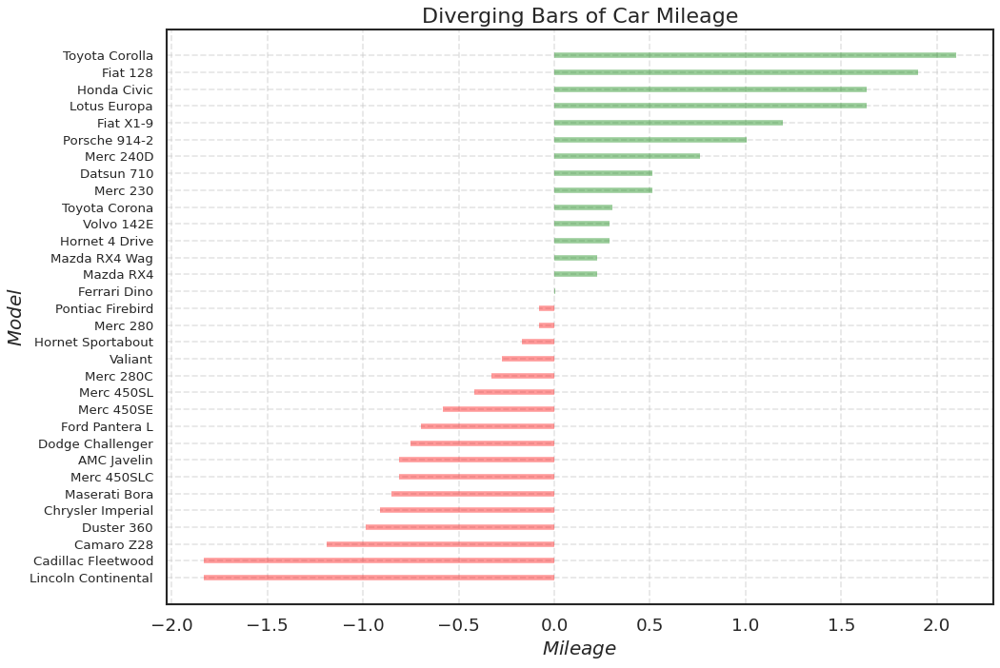

In [ ]:
# Prepare Data
df = pd.read_csv("https://github.com/selva86/datasets/raw/master/mtcars.csv")
x = df.loc[:, ['mpg']]
df['mpg_z'] = (x - x.mean())/x.std()
df['colors'] = ['red' if x < 0 else 'green' for x in df['mpg_z']]
df.sort_values('mpg_z', inplace=True)
df.reset_index(inplace=True)

# Draw plot
plt.figure(figsize=(14,10), dpi= 80)
plt.hlines(y=df.index, xmin=0, xmax=df.mpg_z, color=df.colors, alpha=0.4, linewidth=5)

# Decorations
plt.gca().set(ylabel='$Model$', xlabel='$Mileage$')
plt.yticks(df.index, df.cars, fontsize=12)
plt.title('Diverging Bars of Car Mileage', fontdict={'size':20})
plt.grid(linestyle='--', alpha=0.5)
plt.show()

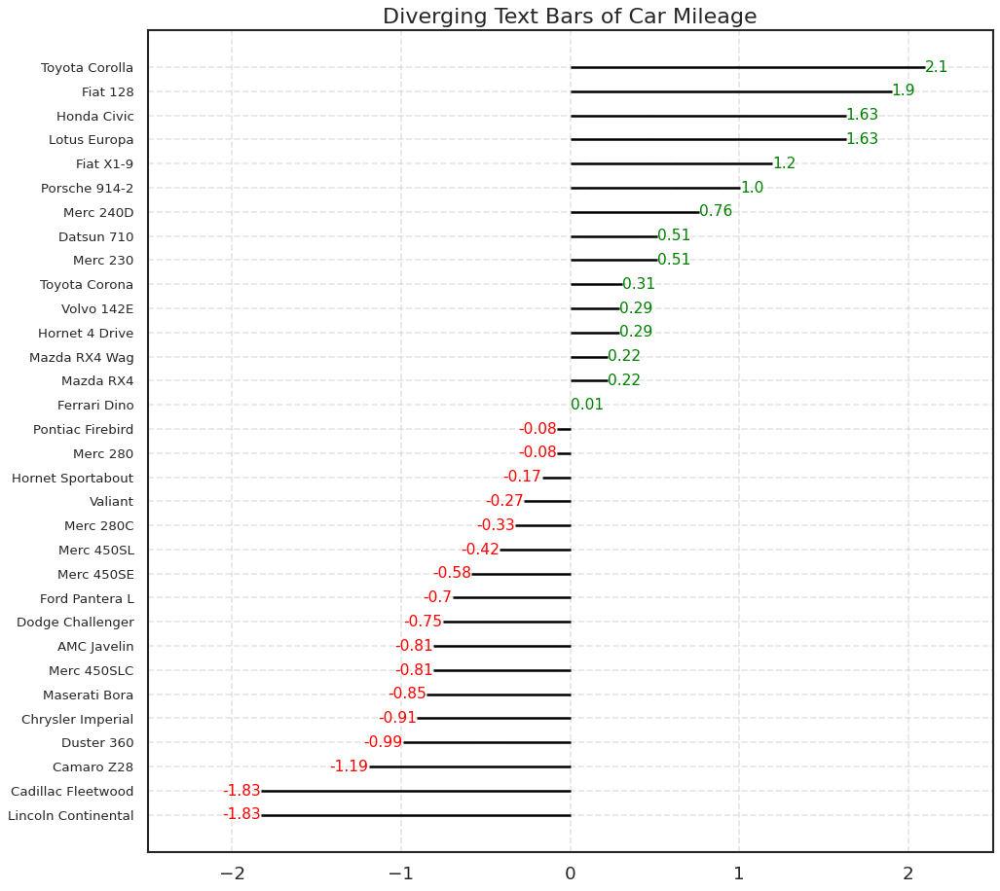

In [ ]:
# Prepare Data
df = pd.read_csv("https://github.com/selva86/datasets/raw/master/mtcars.csv")
x = df.loc[:, ['mpg']]
df['mpg_z'] = (x - x.mean())/x.std()
df['colors'] = ['red' if x < 0 else 'green' for x in df['mpg_z']]
df.sort_values('mpg_z', inplace=True)
df.reset_index(inplace=True)

# Draw plot
plt.figure(figsize=(14,14), dpi= 80)
plt.hlines(y=df.index, xmin=0, xmax=df.mpg_z)
for x, y, tex in zip(df.mpg_z, df.index, df.mpg_z):
    t = plt.text(x, y, round(tex, 2), horizontalalignment='right' if x < 0 else 'left', 
                 verticalalignment='center', fontdict={'color':'red' if x < 0 else 'green', 'size':14})

# Decorations    
plt.yticks(df.index, df.cars, fontsize=12)
plt.title('Diverging Text Bars of Car Mileage', fontdict={'size':20})
plt.grid(linestyle='--', alpha=0.5)
plt.xlim(-2.5, 2.5)
plt.show()

In [ ]:
import plotly.express as px
df = px.data.gapminder().query("continent == 'Oceania'")
fig = px.line(df, x='year', y='lifeExp', color='country', markers=True)
fig.show()


<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px

df = px.data.gapminder().query("country in ['Canada', 'Botswana']")

fig = px.line(df, x="lifeExp", y="gdpPercap", color="country", text="year")
fig.update_traces(textposition="bottom right")
fig.show()

<IPython.core.display.Javascript object>

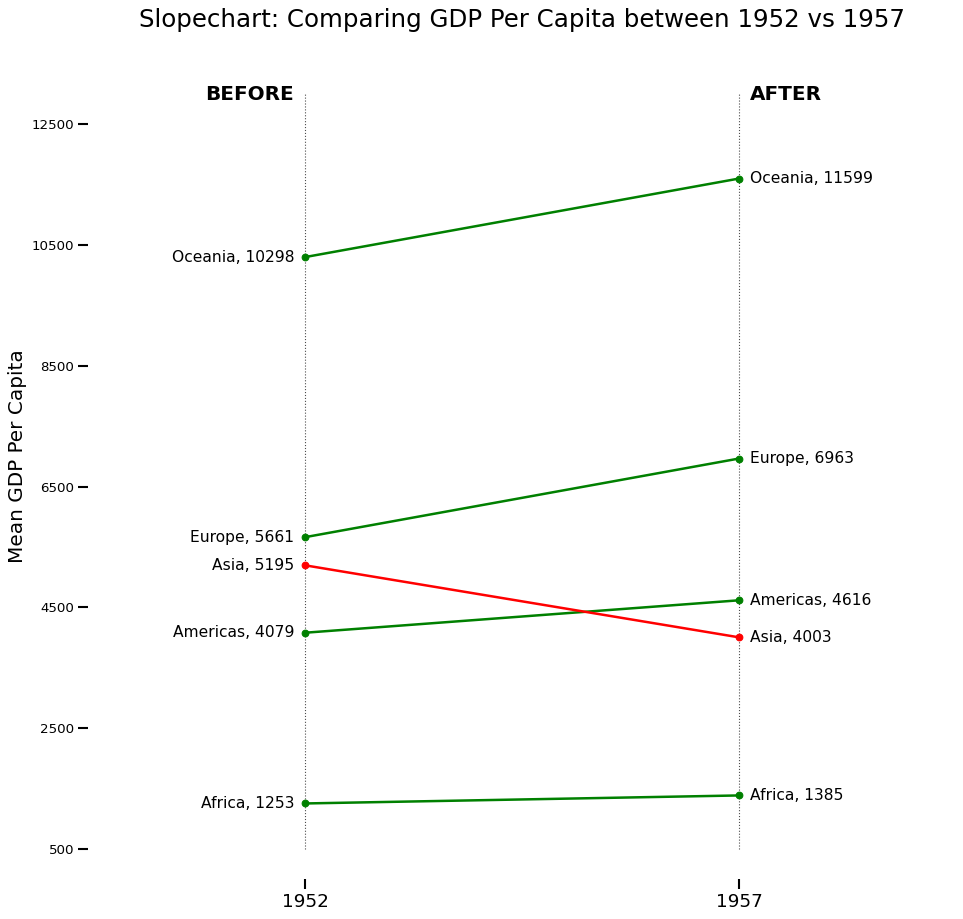

<IPython.core.display.Javascript object>

In [ ]:
import pandas as pd

import matplotlib.lines as mlines
# Import Data
df = pd.read_csv("https://raw.githubusercontent.com/selva86/datasets/master/gdppercap.csv")

left_label = [str(c) + ', '+ str(round(y)) for c, y in zip(df.continent, df['1952'])]
right_label = [str(c) + ', '+ str(round(y)) for c, y in zip(df.continent, df['1957'])]
klass = ['red' if (y1-y2) < 0 else 'green' for y1, y2 in zip(df['1952'], df['1957'])]

# draw line
# https://stackoverflow.com/questions/36470343/how-to-draw-a-line-with-matplotlib/36479941
def newline(p1, p2, color='black'):
    ax = plt.gca()
    l = mlines.Line2D([p1[0],p2[0]], [p1[1],p2[1]], color='red' if p1[1]-p2[1] > 0 else 'green', marker='o', markersize=6)
    ax.add_line(l)
    return l

fig, ax = plt.subplots(1,1,figsize=(14,14), dpi= 80)

# Vertical Lines
ax.vlines(x=1, ymin=500, ymax=13000, color='black', alpha=0.7, linewidth=1, linestyles='dotted')
ax.vlines(x=3, ymin=500, ymax=13000, color='black', alpha=0.7, linewidth=1, linestyles='dotted')

# Points
ax.scatter(y=df['1952'], x=np.repeat(1, df.shape[0]), s=10, color='black', alpha=0.7)
ax.scatter(y=df['1957'], x=np.repeat(3, df.shape[0]), s=10, color='black', alpha=0.7)

# Line Segmentsand Annotation
for p1, p2, c in zip(df['1952'], df['1957'], df['continent']):
    newline([1,p1], [3,p2])
    ax.text(1-0.05, p1, c + ', ' + str(round(p1)), horizontalalignment='right', verticalalignment='center', fontdict={'size':14})
    ax.text(3+0.05, p2, c + ', ' + str(round(p2)), horizontalalignment='left', verticalalignment='center', fontdict={'size':14})

# 'Before' and 'After' Annotations
ax.text(1-0.05, 13000, 'BEFORE', horizontalalignment='right', verticalalignment='center', fontdict={'size':18, 'weight':700})
ax.text(3+0.05, 13000, 'AFTER', horizontalalignment='left', verticalalignment='center', fontdict={'size':18, 'weight':700})

# Decoration
ax.set_title("Slopechart: Comparing GDP Per Capita between 1952 vs 1957", fontdict={'size':22})
ax.set(xlim=(0,4), ylim=(0,14000), ylabel='Mean GDP Per Capita')
ax.set_xticks([1,3])
ax.set_xticklabels(["1952", "1957"])
plt.yticks(np.arange(500, 13000, 2000), fontsize=12)

# Lighten borders
plt.gca().spines["top"].set_alpha(.0)
plt.gca().spines["bottom"].set_alpha(.0)
plt.gca().spines["right"].set_alpha(.0)
plt.gca().spines["left"].set_alpha(.0)
plt.show()

In [ ]:
import plotly.express as px
df = px.data.iris()
fig = px.parallel_coordinates(df, color="species_id", labels={"species_id": "Species",
                  "sepal_width": "Sepal Width", "sepal_length": "Sepal Length",
                  "petal_width": "Petal Width", "petal_length": "Petal Length", },
                    color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)
fig.show()

In [ ]:
import plotly.express as px
df = px.data.tips()
fig = px.parallel_categories(df, color="size", color_continuous_scale=px.colors.sequential.Inferno)
fig.show()

image.png

# <h1><left><font size=10><a name='link6'>8.0:Folium - Maps Plots</a></center></font></h1>

## Folium 

### Folium is a Python library used for visualizing geospatial data, including maps. Folium maps are interactive maps that can be displayed in a web browser, and they are designed to make it easy to visualize and explore geospatial data.

### Folium maps are based on the Leaflet JavaScript library, which provides the underlying functionality for displaying and interacting with maps in a web browser. Folium provides a Python interface to Leaflet, allowing developers to create and customize maps using Python code.

### Some of the key features of Folium maps include:

- ### `Interactivity`: Folium maps are interactive, which means that users can zoom in and out, pan around the map, and click on features to display additional information.

- ### `Customization`: Folium maps can be customized using Python code, allowing developers to modify the appearance and behavior of the map to suit their needs.

- ### `Layering`: Folium maps support layering, which means that developers can add multiple layers to a map, each with its own set of features and properties.

- ### `Data visualization`: Folium maps can be used to visualize a wide range of geospatial data, including points, lines, polygons, and heatmaps.

### Folium maps are used in a wide range of applications, including urban planning, environmental monitoring, and transportation analysis. They are particularly useful in situations where it is important to visualize the spatial distribution of data or to explore data in an interactive and dynamic way.

### When do we use Folium

### Folium is used for visualizing and analyzing geospatial data in Python. Here are a few specific situations where Folium may be useful:

- ### `Location-based data analysis`: Folium can be used to analyze location-based data, such as real estate prices, population density, and crime statistics. By visualizing the data on a map, it is easy to identify patterns and trends in the data, which can be used to inform decision-making.

- ### `Urban planning and development`: Folium can be used to visualize and analyze urban planning and development data, such as traffic patterns, public transportation routes, and land use data. By visualizing the data on a map, it is easy to identify opportunities for improvement and to communicate plans to stakeholders.

- ### `Environmental monitoring`: Folium can be used to visualize and analyze environmental data, such as air quality, water quality, and land use data. By visualizing the data on a map, it is easy to identify areas that may require remediation and to communicate findings to stakeholders.

- ### `Travel and tourism`: Folium can be used to create interactive maps that highlight points of interest, such as tourist attractions, restaurants, and hotels. By providing an interactive and dynamic map, it is easy for users to explore the area and plan their itinerary.

### Overall, Folium is a useful tool for visualizing and analyzing geospatial data in Python, and can be used in a wide range of applications.

### Advantages

### Advantages of using Folium include:

- ### `Interactive maps`: Folium provides an easy-to-use interface for creating interactive maps, which can be used to visualize and explore geospatial data.

- ### `Customization`: Folium allows developers to customize the appearance and behavior of maps using Python code, which can be used to create maps that are tailored to specific needs.

- ### `Data visualization`: Folium provides a range of tools for visualizing geospatial data, including points, lines, polygons, heatmaps, and choropleths, which can be used to identify patterns and trends in the data.

- ### `Open source`: Folium is an open-source library, which means that it is free to use and can be modified and extended by developers.

### Disadvantages

### Disadvantages of using Folium include:

- ### `Limited functionality`: While Folium provides a range of tools for visualizing geospatial data, it may not be suitable for advanced analysis or complex applications.

- ### `Performance issues`: Folium is built on top of the Leaflet JavaScript library, which can be slow and resource-intensive for large datasets.

- ### `Learning curve`: Folium requires some familiarity with Python programming and geospatial data, which can make it challenging for users who are new to these topics.

- ### Compatibility issues`: Folium may not be compatible with all web browsers or operating systems, which can limit its usefulness in some situations.

### Overall, Folium is a powerful tool for visualizing and analyzing geospatial data in Python, but it may have some limitations and require some expertise to use effectively. It is important to carefully consider the data and the audience before deciding to use Folium for a particular application.

### Folium Plots

In [ ]:
!pip install dash

In [ ]:
!pip3 install folium==0.5.0
import folium

print('Folium installed and imported!')

In [ ]:
import plotly.graph_objects as go

import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')
df.head()

df['text'] = df['name'] + '<br>Population ' + (df['pop']/1e6).astype(str)+' million'
limits = [(0,2),(3,10),(11,20),(21,50),(50,3000)]
colors = ["royalblue","crimson","lightseagreen","orange","lightgrey"]
cities = []
scale = 5000

fig = go.Figure()

for i in range(len(limits)):
    lim = limits[i]
    df_sub = df[lim[0]:lim[1]]
    fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = df_sub['lon'],
        lat = df_sub['lat'],
        text = df_sub['text'],
        marker = dict(
            size = df_sub['pop']/scale,
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])))

fig.update_layout(
        title_text = '2014 US city populations<br>(Click legend to toggle traces)',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )
    )

fig.show()

<IPython.core.display.Javascript object>

In [ ]:
# define the world map
world_map = folium.Map()

# display world map
world_map

In [ ]:
# Ghana is located at latitude 7.946527 and longitude -1.023194.
import folium
Ghana_map=folium.Map(location=[7.946527,-1.023194],zoom_start=4)
Ghana_map

In [ ]:
# Ghana is located at latitude 7.946527 and longitude -1.023194.
import folium
Ghana_map=folium.Map(location=[7.946527,-1.023194],zoom_start=4,tiles='Stamen Toner')
Ghana_map

In [ ]:
# Ghana is located at latitude 7.946527 and longitude -1.023194.
import folium
Ghana_map=folium.Map(location=[7.946527,-1.023194],zoom_start=4,tiles='Stamen Terrain')
Ghana_map

In [ ]:
URL = 'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DV0101EN-SkillsNetwork/Data%20Files/Police_Department_Incidents_-_Previous_Year__2016_.csv'

In [ ]:
data=pd.read_csv(URL)
data.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168
2,141059263,WARRANTS,WARRANT ARREST,Monday,04/25/2016 12:00:00 AM,14:59,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010
3,160013662,NON-CRIMINAL,LOST PROPERTY,Tuesday,01/05/2016 12:00:00 AM,23:50,TENDERLOIN,NONE,JONES ST / OFARRELL ST,-122.412971,37.785788,"(37.7857883766888, -122.412970537591)",16001366271000
4,160002740,NON-CRIMINAL,LOST PROPERTY,Friday,01/01/2016 12:00:00 AM,00:30,MISSION,NONE,16TH ST / MISSION ST,-122.419672,37.765050,"(37.7650501214668, -122.419671780296)",16000274071000


In [ ]:
data.shape

(150500, 13)

In [ ]:
# EXtrating part of the Data Sets

In [ ]:
# get the first 100 crimes in the df_incidents dataframe
limit = 100
dfi = data.iloc[0:limit, :]

In [ ]:
dfi.shape

(100, 13)

In [ ]:
dfi.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId
0,120058272,WEAPON LAWS,POSS OF PROHIBITED WEAPON,Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212120
1,120058272,WEAPON LAWS,"FIREARM, LOADED, IN VEHICLE, POSSESSION OR USE",Friday,01/29/2016 12:00:00 AM,11:00,SOUTHERN,"ARREST, BOOKED",800 Block of BRYANT ST,-122.403405,37.775421,"(37.775420706711, -122.403404791479)",12005827212168
2,141059263,WARRANTS,WARRANT ARREST,Monday,04/25/2016 12:00:00 AM,14:59,BAYVIEW,"ARREST, BOOKED",KEITH ST / SHAFTER AV,-122.388856,37.729981,"(37.7299809672996, -122.388856204292)",14105926363010
3,160013662,NON-CRIMINAL,LOST PROPERTY,Tuesday,01/05/2016 12:00:00 AM,23:50,TENDERLOIN,NONE,JONES ST / OFARRELL ST,-122.412971,37.785788,"(37.7857883766888, -122.412970537591)",16001366271000
4,160002740,NON-CRIMINAL,LOST PROPERTY,Friday,01/01/2016 12:00:00 AM,00:30,MISSION,NONE,16TH ST / MISSION ST,-122.419672,37.765050,"(37.7650501214668, -122.419671780296)",16000274071000


In [ ]:
# Method 2
dfii=data.sample(n=100, random_state=42)
dfii.shape

(100, 13)

In [ ]:
# San Francisco latitude and longitude values
latitude = 37.77
longitude = -122.42

# create map and display it
sanfran_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# display the map of San Francisco
sanfran_map

In [ ]:
# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(dfi.Y, dfi.X):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add incidents to map
sanfran_map.add_child(incidents)

In [ ]:
# San Francisco latitude and longitude values
latitude = 37.77
longitude = -122.42

# create map and display it
sanfran_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# display the map of San Francisco
sanfran_map

In [ ]:
dfi[["X","Y"]].head()

,X,Y
0,-122.403405,37.775421
1,-122.403405,37.775421
2,-122.388856,37.729981
3,-122.412971,37.785788
4,-122.419672,37.765050


In [ ]:
# The data should be long and lat
d={"Days":["Mon","Tue","Wed","Thu","Fri"],"long":[-122.40,-122.40,-122.389,-122.413,-122.4197],
   "lat":[37.77,37.77,37.73,37.78,37.65]}
df2=pd.DataFrame(d)
df2

,Days,long,lat
0,Mon,-122.4000,37.77
1,Tue,-122.4000,37.77
2,Wed,-122.3890,37.73
3,Thu,-122.4130,37.78
4,Fri,-122.4197,37.65


In [ ]:
# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(df2.lat, df2.long):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add pop-up text to each marker on the map
latitudes = list(df2.lat)
longitudes = list(df2.long)
labels = list(df2.Days)

for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker([lat, lng], popup=label).add_to(sanfran_map)  
    # add incidents to map
sanfran_map.add_child(incidents)

PLUGINS

In [ ]:
# San Francisco latitude and longitude values
latitude = 37.77
longitude = -122.42

In [ ]:
from folium import plugins

# let's start again with a clean copy of the map of San Francisco
sanfran_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(sanfran_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df2.lat, df2.long, df2.Days):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
sanfran_map

## `Space X Falco 9 Project  Using Folium`

### **Launch Sites Locations Analysis with Folium**


Estimated time needed: **40** minutes


The launch success rate may depend on many factors such as payload mass, orbit type, and so on. It may also depend on the location and proximities of a launch site, i.e., the initial position of rocket trajectories. Finding an optimal location for building a launch site certainly involves many factors and hopefully we could discover some of the factors by analyzing the existing launch site locations.


In the previous exploratory data analysis labs, you have visualized the SpaceX launch dataset using `matplotlib` and `seaborn` and discovered some preliminary correlations between the launch site and success rates. In this lab, you will be performing more interactive visual analytics using `Folium`.


#### Objectives


This lab contains the following tasks:

*   **TASK 1:** Mark all launch sites on a map
*   **TASK 2:** Mark the success/failed launches for each site on the map
*   **TASK 3:** Calculate the distances between a launch site to its proximities

After completed the above tasks, you should be able to find some geographical patterns about launch sites.


Let's first import required Python packages for this lab:


In [ ]:
!pip3 install folium
!pip3 install wget

In [ ]:
import folium
import wget
import pandas as pd

In [ ]:
# Import folium MarkerCluster plugin
from folium.plugins import MarkerCluster
# Import folium MousePosition plugin
from folium.plugins import MousePosition
# Import folium DivIcon plugin
from folium.features import DivIcon

If you need to refresh your memory about folium, you may download and refer to this previous folium lab:


[Generating Maps with Python](https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/labs/module\_3/DV0101EN-3-5-1-Generating-Maps-in-Python-py-v2.0.ipynb)


### Task 1: Mark all launch sites on a map


First, let's try to add each site's location on a map using site's latitude and longitude coordinates


The following dataset with the name `spacex_launch_geo.csv` is an augmented dataset with latitude and longitude added for each site.


In [ ]:
# Download and read the `spacex_launch_geo.csv`
spacex_csv_file = wget.download('https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/datasets/spacex_launch_geo.csv')
spacex_df=pd.read_csv(spacex_csv_file)

Now, you can take a look at what are the coordinates for each site.


In [ ]:
# Select relevant sub-columns: `Launch Site`, `Lat(Latitude)`, `Long(Longitude)`, `class`
spacex_df = spacex_df[['Launch Site', 'Lat', 'Long', 'class']]
launch_sites_df = spacex_df.groupby(['Launch Site'], as_index=False).first()
launch_sites_df = launch_sites_df[['Launch Site', 'Lat', 'Long']]
launch_sites_df

,Launch Site,Lat,Long
0,CCAFS LC-40,28.562302,-80.577356
1,CCAFS SLC-40,28.563197,-80.576820
2,KSC LC-39A,28.573255,-80.646895
3,VAFB SLC-4E,34.632834,-120.610745


Above coordinates are just plain numbers that can not give you any intuitive insights about where are those launch sites. If you are very good at geography, you can interpret those numbers directly in your mind. If not, that's fine too. Let's visualize those locations by pinning them on a map.


We first need to create a folium `Map` object, with an initial center location to be NASA Johnson Space Center at Houston, Texas.


In [ ]:
# Start location is NASA Johnson Space Center
nasa_coordinate = [29.559684888503615, -95.0830971930759]
site_map = folium.Map(location=nasa_coordinate, zoom_start=10)

We could use `folium.Circle` to add a highlighted circle area with a text label on a specific coordinate. For example,


In [ ]:
# Create a blue circle at NASA Johnson Space Center's coordinate with a popup label showing its name
circle = folium.Circle(nasa_coordinate, radius=1000, color='#d35400', fill=True).add_child(folium.Popup('NASA Johnson Space Center'))
# Create a blue circle at NASA Johnson Space Center's coordinate with a icon showing its name
marker = folium.map.Marker(
    nasa_coordinate,
    # Create an icon as a text label
    icon=DivIcon(
        icon_size=(20,20),
        icon_anchor=(0,0),
        html='<div style="font-size: 12; color:#d35400;"><b>%s</b></div>' % 'NASA JSC',
        )
    )
site_map.add_child(circle)
site_map.add_child(marker)

and you should find a small yellow circle near the city of Houston and you can zoom-in to see a larger circle.


Now, let's add a circle for each launch site in data frame `launch_sites`


*TODO:*  Create and add `folium.Circle` and `folium.Marker` for each launch site on the site map


An example of folium.Circle:


`folium.Circle(coordinate, radius=1000, color='#000000', fill=True).add_child(folium.Popup(...))`


An example of folium.Marker:


`folium.map.Marker(coordinate, icon=DivIcon(icon_size=(20,20),icon_anchor=(0,0), html='<div style="font-size: 12; color:#d35400;"><b>%s</b></div>' % 'label', ))`


In [ ]:
# Initial the map
site_map = folium.Map(location=nasa_coordinate, zoom_start=5)
# For each launch site, add a Circle object based on its coordinate (Lat, Long) values. In addition, add Launch site name as a popup label
#Convert dataframe to dictionary with Long/Lat
launch_sites_dict_longlat = launch_sites_df.set_index('Launch Site').T.to_dict('list')
launch_sites_dict_longlat

{'CCAFS LC-40': [28.56230197, -80.57735648],
 'CCAFS SLC-40': [28.56319718, -80.57682003],
 'KSC LC-39A': [28.57325457, -80.64689529],
 'VAFB SLC-4E': [34.63283416, -120.6107455]}

In [ ]:
# Loop through the dictionary to create Landing site circles/labels/markers
for x, y in launch_sites_dict_longlat.items():
    # Create a blue circle at site coordinates with a popup label showing its name
    circle = folium.Circle(y, radius=1000, color='#d35400', fill=True).add_child(folium.Popup(x + ' Launch Site'))
    # Create a blue circle site coordinates with a icon showing its name
    marker = folium.map.Marker(
    y,
    # Create an icon as a text label
    icon=DivIcon(
        icon_size=(20,20),
        icon_anchor=(0,0),
        html='<div style="font-size: 12; color:(#ADD8E6);"><b>%s</b></div>' % x,
        )
    )
    site_map.add_child(circle)
    site_map.add_child(marker)  

In [ ]:
site_map

The generated map with marked launch sites should look similar to the following:


<center>
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/labs/module_3/images/launch_site_markers.png" />
</center>


Now, you can explore the map by zoom-in/out the marked areas
, and try to answer the following questions:

*   Are all launch sites in proximity to the Equator line?
*   Are all launch sites in very close proximity to the coast?

Also please try to explain your findings.


### Task 2: Mark the success/failed launches for each site on the map


Next, let's try to enhance the map by adding the launch outcomes for each site, and see which sites have high success rates.
Recall that data frame spacex_df has detailed launch records, and the `class` column indicates if this launch was successful or not


In [ ]:
spacex_df.tail(10)

,Launch Site,Lat,Long,class
46,KSC LC-39A,28.573255,-80.646895,1
47,KSC LC-39A,28.573255,-80.646895,1
48,KSC LC-39A,28.573255,-80.646895,1
49,CCAFS SLC-40,28.563197,-80.576820,1
50,CCAFS SLC-40,28.563197,-80.576820,1
51,CCAFS SLC-40,28.563197,-80.576820,0
52,CCAFS SLC-40,28.563197,-80.576820,0
53,CCAFS SLC-40,28.563197,-80.576820,0
54,CCAFS SLC-40,28.563197,-80.576820,1
55,CCAFS SLC-40,28.563197,-80.576820,0


Next, let's create markers for all launch records.
If a launch was successful `(class=1)`, then we use a green marker and if a launch was failed, we use a red marker `(class=0)`


Note that a launch only happens in one of the four launch sites, which means many launch records will have the exact same coordinate. Marker clusters can be a good way to simplify a map containing many markers having the same coordinate.


Let's first create a `MarkerCluster` object


In [ ]:
marker_cluster = MarkerCluster()


*TODO:* Create a new column in `launch_sites` dataframe called `marker_color` to store the marker colors based on the `class` value


In [ ]:
# Apply a function to check the value of `class` column
# If class=1, marker_color value will be green
# If class=0, marker_color value will be red


In [ ]:
# Function to assign color to launch outcome
def assign_marker_color(launch_outcome):
    if launch_outcome == 1:
        return 'green'
    else:
        return 'red'
    
spacex_df['marker_color'] = spacex_df['class'].apply(assign_marker_color)
spacex_df.tail(10)

,Launch Site,Lat,Long,class,marker_color
46,KSC LC-39A,28.573255,-80.646895,1,green
47,KSC LC-39A,28.573255,-80.646895,1,green
48,KSC LC-39A,28.573255,-80.646895,1,green
49,CCAFS SLC-40,28.563197,-80.576820,1,green
50,CCAFS SLC-40,28.563197,-80.576820,1,green
51,CCAFS SLC-40,28.563197,-80.576820,0,red
52,CCAFS SLC-40,28.563197,-80.576820,0,red
53,CCAFS SLC-40,28.563197,-80.576820,0,red
54,CCAFS SLC-40,28.563197,-80.576820,1,green
55,CCAFS SLC-40,28.563197,-80.576820,0,red


*TODO:* For each launch result in `spacex_df` data frame, add a `folium.Marker` to `marker_cluster`


In [ ]:
# Add marker_cluster to current site_map
site_map.add_child(marker_cluster)

# for each row in spacex_df data frame
# create a Marker object with its coordinate
# and customize the Marker's icon property to indicate if this launch was successed or failed, 
# e.g., icon=folium.Icon(color='white', icon_color=row['marker_color']
for index, record in spacex_df.iterrows():
    # TODO: Create and add a Marker cluster to the site map
    marker = folium.Marker([record[1], record[2]], icon=folium.Icon(color='white', icon_color=record[4]))
    marker_cluster.add_child(marker)

site_map

Your updated map may look like the following screenshots:


<center>
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/labs/module_3/images/launch_site_marker_cluster.png" />
</center>


<center>
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/labs/module_3/images/launch_site_marker_cluster_zoomed.png" />
</center>


From the color-labeled markers in marker clusters, you should be able to easily identify which launch sites have relatively high success rates.


### TASK 3: Calculate the distances between a launch site to its proximities


Next, we need to explore and analyze the proximities of launch sites.


Let's first add a `MousePosition` on the map to get coordinate for a mouse over a point on the map. As such, while you are exploring the map, you can easily find the coordinates of any points of interests (such as railway)


In [ ]:
# Add Mouse Position to get the coordinate (Lat, Long) for a mouse over on the map
formatter = "function(num) {return L.Util.formatNum(num, 5);};"
mouse_position = MousePosition(
    position='topright',
    separator=' Long: ',
    empty_string='NaN',
    lng_first=False,
    num_digits=20,
    prefix='Lat:',
    lat_formatter=formatter,
    lng_formatter=formatter,
)

site_map.add_child(mouse_position)
site_map

Now zoom in to a launch site and explore its proximity to see if you can easily find any railway, highway, coastline, etc. Move your mouse to these points and mark down their coordinates (shown on the top-left) in order to the distance to the launch site.


You can calculate the distance between two points on the map based on their `Lat` and `Long` values using the following method:


In [ ]:
from math import sin, cos, sqrt, atan2, radians

def calculate_distance(lat1, lon1, lat2, lon2):
    # approximate radius of earth in km
    R = 6373.0

    lat1 = radians(lat1)
    lon1 = radians(lon1)
    lat2 = radians(lat2)
    lon2 = radians(lon2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance

*TODO:* Mark down a point on the closest coastline using MousePosition and calculate the distance between the coastline point and the launch site.


In [ ]:
# find coordinate of the closet coastline
# e.g.,: Lat: 28.56367  Lon: -80.57163
distance_coastline = calculate_distance(34.632834161782775, -120.61074553068327, 34.63709, -120.62450)

*TODO:* After obtained its coordinate, create a `folium.Marker` to show the distance


In [ ]:
# Create and add a folium.Marker on your selected closest coastline point on the map
# Display the distance between coastline point and launch site using the icon property 
# for example
distance_marker = folium.Marker([ 34.63709, -120.62450], icon=DivIcon(icon_size=(20,20), icon_anchor=(0,0),
    html='<div style="font-size: 12; color:#d35400;"><b>%s</b></div>' % "{:10.2f} KM".format(distance_coastline)))

*TODO:* Draw a `PolyLine` between a launch site to the selected coastline point


In [ ]:
# Create a `folium.PolyLine` object using the coastline coordinates and launch site coordinate
lines=folium.PolyLine(locations=[[34.632834161782775, -120.61074553068327], [ 34.63709, -120.62450]], weight=1)
site_map.add_child(distance_marker)
site_map.add_child(lines)

Your updated map with distance line should look like the following screenshot:


<center>
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/labs/module_3/images/launch_site_marker_distance.png" />
</center>


*TODO:* Similarly, you can draw a line betwee a launch site to its closest city, railway, highway, etc. You need to use `MousePosition` to find the their coordinates on the map first


A railway map symbol may look like this:


<center>
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/labs/module_3/images/railway.png" />
</center>


A highway map symbol may look like this:


<center>
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/labs/module_3/images/highway.png" />
</center>


A city map symbol may look like this:


<center>
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/labs/module_3/images/city.png" />
</center>


In [ ]:
# Create a marker with distance to a closest city, railway, highway, etc.
# Draw a line between the marker to the launch site

# Create a marker with distance to a closest city, railway, highway, etc.
distance_railways = calculate_distance(34.632834161782775, -120.61074553068327, 34.63487, -120.62448)
distance_marker_railways = folium.Marker([34.63487, -120.62448], icon=DivIcon(icon_size=(20,20), icon_anchor=(0,0),
    html='<div style="font-size: 12; color:#d35400;"><b>%s</b></div>' % "{:10.2f} KM".format(distance_railways)))
site_map.add_child(distance_marker_railways)

# Draw a line between the marker to the launch site
lines_railways=folium.PolyLine(locations=[[34.632834161782775, -120.61074553068327], [34.63487, -120.62448]], weight=1.2)
site_map.add_child(lines_railways)

In [ ]:
# Create a marker with distance to a closest city, railway, highway, etc.
distance_highway = calculate_distance(34.632834161782775, -120.61074553068327, 34.64143, -120.61851)
distance_marker_highway = folium.Marker([34.64143, -120.61851], icon=DivIcon(icon_size=(20,20), icon_anchor=(0,0),
    html='<div style="font-size: 12; color:#d35400;"><b>%s</b></div>' % "{:10.2f} KM".format(distance_highway)))
site_map.add_child(distance_marker_highway)

# Draw a line between the marker to the launch site
lines_highway=folium.PolyLine(locations=[[34.632834161782775, -120.61074553068327], [34.64143, -120.61851]], weight=1.2)
site_map.add_child(lines_highway)

In [ ]:
# Create a marker with distance to a closest city, railway, highway, etc.
distance_city = calculate_distance(34.632834161782775, -120.61074553068327, 34.63688, -120.45685)
distance_marker_city = folium.Marker([34.63688, -120.45685], icon=DivIcon(icon_size=(20,20), icon_anchor=(0,0),
    html='<div style="font-size: 12; color:#d35400;"><b>%s</b></div>' % "{:10.2f} KM".format(distance_city)))
site_map.add_child(distance_marker_city)

# Draw a line between the marker to the launch site
lines_city=folium.PolyLine(locations=[[34.632834161782775, -120.61074553068327], [34.63688, -120.45685]], weight=1.2)
site_map.add_child(lines_city)

After you plot distance lines to the proximities, you can answer the following questions easily:

*   Are launch sites in close proximity to railways?
*   Are launch sites in close proximity to highways?
*   Are launch sites in close proximity to coastline?
*   Do launch sites keep certain distance away from cities?


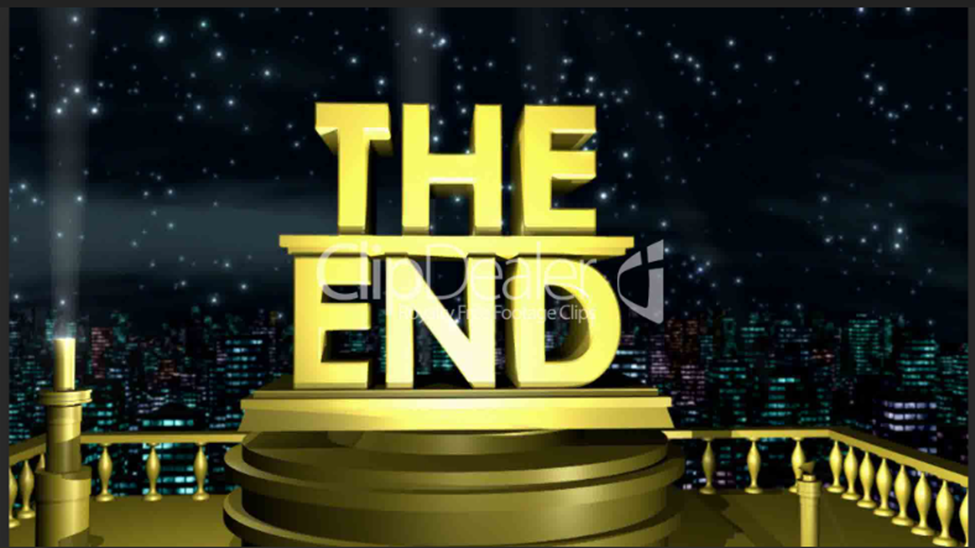